# <CENTER> **PROJECT: Tutors lessons prices prediction**

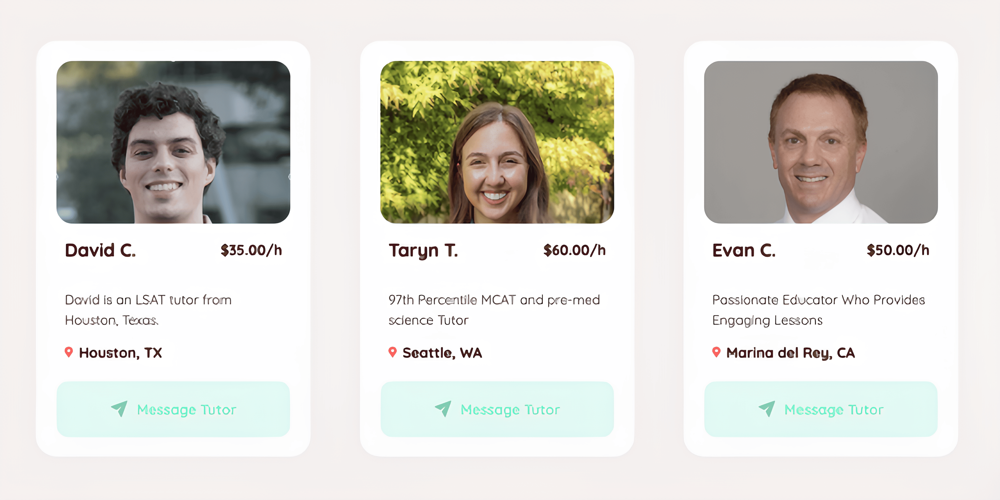

---

#### **Описание:**

Онлайн-образование активно развивается, и ученики хотят понимать, сколько будут стоить услуги репетитора еще до выбора специалиста. Однако стоимость занятий зависит от множества факторов: опыта преподавателя, его рейтинга, образования и даже деталей, указанных в описании профиля.

---

#### **Постановка задачи:**

Разработать модель прогнозирования, которая сможет предсказать среднюю стоимость услуг репетитора за минуту (в рублях) на основе различных данных о нем.

---


#### **Основные цели:**

* Сформировать набор данных на основе предоставленных источников информации;

* Спроектировать новые признаки с помощью *Feature Engineering* и выявить наиболее значимые при построении модели;

* Исследовать предоставленные данные и выявить закономерности;

* Построить несколько моделей и выбрать из них ту, которая показывает наилучший результат по заданной метрике.

---


#### **Этапы работы над проектом:**

Проект будет состоять из восьми частей:

`1.` *Базовый анализ и знакомство с данными*;

`2.` *Очистка данных*;

`3.` *Преобразование признаков*;

`4.` *Разведывательный анализ данных (EDA)*;

`5.` *Feature engineering (Создание новых признаков)*;

`6.` *Отбор признаков*;

`7.` *Machine Learning*;

`8.` *Вывод*.

---

**Импортируем необходимые библиотеки:**

In [1]:
# Для работы с данными
import numpy as np
import pandas as pd
import ast
import category_encoders as ce
from imblearn import over_sampling


# Для построения графиков
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# Для построения моделей
from sklearn import feature_selection
from sklearn import preprocessing
from sklearn import metrics
from sklearn import linear_model
from sklearn import ensemble
from sklearn import model_selection
from sklearn import tree
from sklearn import neighbors
from sklearn import svm
from xgboost import XGBRegressor
import optuna


# Для сохранения модели
import joblib

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


**Загрузка данных:**

In [ ]:
# Загружаем тренеровочную и тестовую выборки
train_data = pd.read_excel('data/train.xlsx')
test_data = pd.read_excel('data/test.xlsx')


# Выводим размерности
print(f'Размер тренеровочной выборки: {train_data.shape}')
print(f'Размер тестовой выборки: {test_data.shape}')

Объединим оба датасета в один для выполнения различных преобразований:

In [71]:
# Создаём копию тестового файла
X_test = test_data.copy()


# Создаём общий для обеих выборок признак 'is_train', 
# чтобы в дальнейшем данные легче было обратно разделить
train_data['is_train'] = 1
test_data['is_train'] = 0


# Объединяем данные
combined_data = pd.concat(
    [train_data, test_data],
    axis = 0,
    ignore_index = True
)

# Создаём копию
combined_df = combined_data.copy()

## <CENTER> **`1.` Базовый анализ и знакомство с данными**

На данном этапе изучим информацию предоставленных данных.

#### $1.1$

Выведем информацию по таблице:

In [72]:
# Выводим размеры таблицы
print('Данные имеют следующую размерность:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(combined_df.shape[0], combined_df.shape[1]))


# Выведем первые пять строк 
display(combined_df.head())

Данные имеют следующую размерность:

Количество строк: 6064;
Количество признаков (столбцов): 29.


,Unnamed: 0,предмет,ФИО,tutor_head_tags,tutor_rating,tutor_reviews,description,experience_desc,Education_1,Desc_Education_1,...,experience,Desc_Education_5,Desc_Education_6,Education_5,Education_6,Ученая степень 2,Ученое звание 2,categories,mean_price,is_train
0,0,matematika,Репетитор по математике Емельянова Марина Вла...,"['Школьная программа', 'Подготовка к ЕГЭ', 'По...",5.0,2,Репетитор не предоставил о себе дополн...,NaN,Томский государственный университет им. В.В. ...,"Год окончания: 1990, Факультет: механико-мате...",...,31 год,NaN,NaN,NaN,NaN,NaN,NaN,"['Школьники с 5 по 9 класс', 'Школьники с 10 п...",16.666667,1
1,1,matematika,Репетитор по математике Назарова Анастасия Ан...,"['Школьная программа', 'Подготовка к ЕГЭ', 'По...",4.0,7,Репетитор не предоставил о себе дополн...,NaN,Вологодский государственный педагогический ун...,"Год окончания: 2017, Факультет: факультет при...",...,8 лет,NaN,NaN,NaN,NaN,NaN,NaN,"['Школьники с 5 по 9 класс', 'Школьники с 10 п...",11.666667,1
2,2,informatika,Репетитор по информатике Мотроненко Инна Конст...,"['Школьная программа', 'Подготовка к ЕГЭ', 'По...",0.0,0,"Выезд за город: Балашиха-1, Балашиха-2...",Московская Школа (учитель ...,Московский городской педагогический университет,"Год окончания: 2008, Факультет: Математически...",...,11 лет,NaN,NaN,NaN,NaN,NaN,NaN,"['Школьники с 5 по 9 класс', 'Школьники с 10 п...",23.333333,1
3,3,matematika,Репетитор по математике Логинова Елизавета Ал...,"['Школьная программа', 'Математический анализ'...",4.0,19,"Здравствуйте! Меня зовут Елизавета, о...",NaN,Санкт-Петербургский государственный университет,"Год окончания: 2021, Факультет: физический фа...",...,5 лет,NaN,NaN,NaN,NaN,NaN,NaN,"['Школьники с 1 по 4 класс', 'Школьники с 5 по...",0.116667,1
4,4,matematika,Репетитор по математике Харланов Олег Викторо...,"['Школьная программа', 'Подготовка к ЕГЭ', 'По...",0.0,0,"Целеустремленный, ориентирован на резу...",преподавателем ...,Приазовский государственный технический униве...,"Год окончания: 2005, Факультет: Энергетически...",...,19 лет,NaN,NaN,NaN,NaN,NaN,NaN,"['Школьники с 5 по 9 класс', 'Школьники с 10 п...",16.666667,1


#### **Основные характеристики:**

В датафрейме представлен следующий набор признаков:

* `предмет` - subject taught by the teacher;

* `ФИО` - tutor's name;

* `tutor_head_tags` - What level does the tutor prepare for?;

* `tutor_rating` - Tutor's rating;

* `tutor_reviews` - Number of reviews;

* `description` - The "About me" field, which is filled by the tutor himself;

* `experience_desc` - Description of the tutor experience;

* `Education_i` - The university the tutor graduated from;

* `Desc_Education_i` - Faculty, specialty, year of graduation and other information about education i;

* `Ученая степень i` - Academic degree;

* `Ученое звание i` - Academic title;

* `categories` - Categories of students that the tutor is ready to take;

* `etc.`;

**Целевой признак:**

* `mean_price` - Average cost of tutor services per minute.

---

#### $1.2$

Выведем информацию по признакам:

In [73]:
# Вывод таблицы
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6064 entries, 0 to 6063
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        6064 non-null   int64  
 1   предмет           6064 non-null   object 
 2   ФИО               6064 non-null   object 
 3   tutor_head_tags   6064 non-null   object 
 4   tutor_rating      5475 non-null   float64
 5   tutor_reviews     6064 non-null   int64  
 6   description       6062 non-null   object 
 7   experience_desc   2928 non-null   object 
 8   Education_1       6064 non-null   object 
 9   Desc_Education_1  5970 non-null   object 
 10  Education_2       1067 non-null   object 
 11  Desc_Education_2  1062 non-null   object 
 12  Education_3       140 non-null    object 
 13  Desc_Education_3  139 non-null    object 
 14  Education_4       19 non-null     object 
 15  Desc_Education_4  19 non-null     object 
 16  Ученая степень 1  96 non-null     object 


Подсчитаем количество по типам признаков:

In [74]:
# Подсчет количества признаков типа 'object', 'int64' и 'float64'      
object_columns_count = combined_df.select_dtypes(include = ['object']).shape[1]
int64_columns_count = combined_df.select_dtypes(include = ['int64']).shape[1]
float64_columns_count = combined_df.select_dtypes(include = ['float64']).shape[1]


# Вывод результата
print('В данных представлены признаки следующих типов:\n')
print(f"Количество признаков типа 'object': {object_columns_count}")
print(f"Количество признаков типа 'int64': {int64_columns_count}")
print(f"Количество признаков типа 'float64': {float64_columns_count}")

В данных представлены признаки следующих типов:

Количество признаков типа 'object': 24
Количество признаков типа 'int64': 3
Количество признаков типа 'float64': 2


#### $1.3$

Выведем описательные характеристики по признакам:

In [75]:
# Вывод таблицы
combined_df.describe()

,Unnamed: 0,tutor_rating,tutor_reviews,mean_price,is_train
count,6064.000000,5475.000000,6064.000000,4548.000000,6064.000000
mean,1894.500000,1.817352,2.992744,16.197949,0.750000
std,1331.113986,2.261065,8.514501,10.485108,0.433048
min,0.000000,0.000000,0.000000,0.041667,0.000000
25%,757.750000,0.000000,0.000000,10.000000,0.750000
50%,1515.500000,0.000000,0.000000,15.000000,1.000000
75%,3031.250000,4.000000,2.000000,20.888889,1.000000
max,4547.000000,5.000000,152.000000,100.000000,1.000000


## <CENTER> **`2.` Очистка данных**

На данном этапе выявим и очистим данные от пропусков, дубликатов и выбрасов.

#### $2.1$

**Проверим данные на наличие пропусков:**

Суммарное количество пропусков в данных: 87687 

Информация по количествам пропусков: 

Unnamed: 0             0
предмет                0
ФИО                    0
tutor_head_tags        0
tutor_rating         589
tutor_reviews          0
description            2
experience_desc     3136
Education_1            0
Desc_Education_1      94
Education_2         4997
Desc_Education_2    5002
Education_3         5924
Desc_Education_3    5925
Education_4         6045
Desc_Education_4    6045
Ученая степень 1    5968
Ученое звание 1     6022
status                16
experience            35
Desc_Education_5    6060
Desc_Education_6    6063
Education_5         6060
Education_6         6063
Ученая степень 2    6062
Ученое звание 2     6063
categories             0
mean_price          1516
is_train               0
dtype: int64 

Desc_Education_6    99.983509
Ученое звание 2     99.983509
Education_6         99.983509
Ученая степень 2    99.967018
Education_5         99.934037
Desc_Education_5    99

<Axes: >

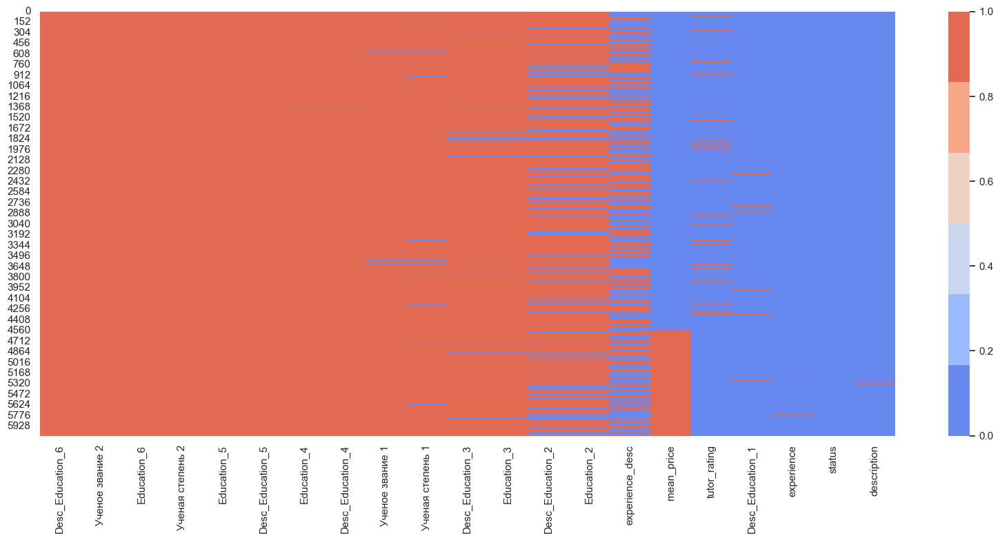

In [ ]:
# Выводим суммарное количество пропусков
print('Суммарное количество пропусков в данных: {} \n'.format(combined_df.isnull().sum().sum()))
print('-' * 50)

# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n'.format(combined_df.isnull().sum()))
print('-' * 50)



# Построим тепловую карту пропусков
# Создаём функцию отображения пропущенных значений на тепловой карте
def missing_values_heatmap(data):
    
    # Рассчитываем количество пропусков
    cols_null_persent = data.isnull().mean() * 100
    cols_with_null = cols_null_persent[cols_null_persent > 0].sort_values(ascending = False)
    print(f'Информация по количествам пропусков в процентах:\n\n{cols_with_null}')
    print('-' * 50)
    
    # Задаём параметры графика
    colors = sns.color_palette('coolwarm')
    fig = plt.figure(figsize = (30, 13))
    cols = cols_with_null.index
    
    # Строим тепловую карту
    ax = sns.heatmap(
        data = data[cols].isnull(),
        cmap = sns.color_palette(colors)
    )
    
    # Задаём название графика
    plt.title('Тепловая карта пропущенных значений', fontsize = 20)
    
    return ax



# Применяем полученную функцию к нашему датасету
missing_values_heatmap(combined_df)

**Вывод:**

Из полученной информации видно, что пропуски имеют следующие признаки:

* *Desc_Education_6*______________99.98 %
* *Ученое звание 2*_______________99.98 %
* *Education_6*___________________99.98 %
* *Ученая степень 2*______________99.96 %
* *Education_5*___________________99.93 %
* *Desc_Education_5*______________99.93 %
* *Education_4*___________________99.68 %
* *Desc_Education_4*______________99.68 %
* *Ученое звание 1*_______________99.30 %
* *Ученая степень 1*______________98.41 %
* *Desc_Education_3*______________97.70 %
* *Education_3*___________________97.69 %
* *Desc_Education_2*______________82.48 %
* *Education_2*___________________82.40 %
* *experience_desc*_______________51.71 %
* *mean_price*____________________25.00 %
* *tutor_rating*___________________9.71 %
* *Desc_Education_1*_______________1.55 %
* *experience*_____________________0.57 %
* *status*_________________________0.26 %
* *description*____________________0.03 %

Как видно из полученных расчётов, абсолютное большинство признаков имеют пропуски в количестве то 80% и больше.

Наличие пропусков в целевой переменной `mean_price` объясняется тем, что данный признак отсутствует в тестовой выборке, следовательно, после объединения тренировочной и тестовой выборок в полученном датасете образовались пропуски в тестовой части таблицы. Поэтому, данный признак обрабатывать не будем.

Следовательно, признаки с количеством пропусков > 50% (признак `experience_desc` учитывать не будем) удалим.

Оставшиеся признаки обработаем следующим образом:

* Пропуски в `Desc_Education_1` и `experience` заполним строкой **нет данных**; 

* Пропуски в `experience_desc`, `status` и `description` заполним **модой**;

* Пропуски в `tutor_rating` заполним **медианой**.

In [77]:
# Создаём список с сумарным количеством пропусков больше 60%
threshold = 0.6
missing_ratio = combined_df.isnull().mean()
columns_to_drop = missing_ratio[missing_ratio > threshold].index

# Удаляем признаки из данных
combined_df = combined_df.drop(columns = columns_to_drop)
X_test = X_test.drop(columns = columns_to_drop)
print(f'Удалены признаки: {list(columns_to_drop)}')



# Заполняем пропущенные значения медианой
combined_df['tutor_rating'] = combined_df['tutor_rating'].fillna(combined_df['tutor_rating'].median())
X_test['tutor_rating'] = X_test['tutor_rating'].fillna(X_test['tutor_rating'].median())



# Заполняем пропущенные значения модой
columns_to_fill_mode = [
    'experience_desc',
    'status',
    'description'
]

for column in columns_to_fill_mode:
    combined_df[column] = combined_df[column].fillna(combined_df[column].mode()[0])
    X_test[column] = X_test[column].fillna(X_test[column].mode()[0])
    
    
    
# Заполняем пропущенные значения строкой 'нет данных'
columns_to_fill_string = [
    'Desc_Education_1',
    'experience'
]

for column in columns_to_fill_string:
    combined_df[column] = combined_df[column].fillna('нет данных')
    X_test[column] = X_test[column].fillna('нет данных')

Удалены признаки: ['Education_2', 'Desc_Education_2', 'Education_3', 'Desc_Education_3', 'Education_4', 'Desc_Education_4', 'Ученая степень 1', 'Ученое звание 1', 'Desc_Education_5', 'Desc_Education_6', 'Education_5', 'Education_6', 'Ученая степень 2', 'Ученое звание 2']


Выведем количество пропусков основной выборки:

In [78]:
# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n\n'.format(combined_df.isnull().sum()))


# Выводим размерность таблицы
print('Размерность таблицы после удаления пропусков: {}'.format(combined_df.shape))

Информация по количествам пропусков: 

Unnamed: 0             0
предмет                0
ФИО                    0
tutor_head_tags        0
tutor_rating           0
tutor_reviews          0
description            0
experience_desc        0
Education_1            0
Desc_Education_1       0
status                 0
experience             0
categories             0
mean_price          1516
is_train               0
dtype: int64 


Размерность таблицы после удаления пропусков: (6064, 15)


Выведем количество пропусков тестовой выборки:

In [79]:
# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n\n'.format(X_test.isnull().sum()))


# Выводим размерность таблицы
print('Размерность таблицы после удаления пропусков: {}'.format(X_test.shape))

Информация по количествам пропусков: 

Unnamed: 0          0
предмет             0
ФИО                 0
tutor_head_tags     0
tutor_rating        0
tutor_reviews       0
description         0
experience_desc     0
Education_1         0
Desc_Education_1    0
status              0
experience          0
categories          0
dtype: int64 


Размерность таблицы после удаления пропусков: (1516, 13)


#### $2.2$

**Проверяем данные на наличие дубликатов:**

In [80]:
# Создаём список признаков
dupl_columns = list(combined_df.columns)


# Создаём маску дубликатов с помощью метода duplicated() и произведём фильтрацию
mask = combined_df.duplicated(subset = dupl_columns)
train_duplicates = combined_df[mask]
print(f'Число найденных дубликатов: {train_duplicates.shape[0]}')

Число найденных дубликатов: 0


#### $2.3$

**Проверяем данные на наличие выбросов.**

Создадим список признаков с возможными выбросами:

In [81]:
# Создание списка признаков типа 'int64' и 'float64'
numeric_columns = combined_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

Создадим функцию для поиска выбросов:

In [82]:
# Функция для поиска выбросов через IQR
def detect_outliers_iqr(data, features):
    
    # Создаём словарь, ключами которого будут индексы признаков,
    # а значениями - их количество
    outliers_dict = {}
    
    
    # Пройдёмся циклом for по признакам
    for feature in features:
        
        Q1 = data[feature].quantile(0.25)         # первый квартиль
        Q3 = data[feature].quantile(0.75)         # третий квартиль
        IQR = Q3 - Q1                             # межквартильный размах
        
        # Границы (нижняя и верхняя) для определения выбросов
        lower_bound = Q1 - 1.5 * IQR    
        upper_bound = Q3 + 1.5 * IQR   
        
        # Поиск выбросов
        outliers_dict[feature] = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)][feature]  
        
    return outliers_dict

Организуем поиск выбросов:

In [83]:
# Создаём переменную, в котором будем хранить признаки с количеством выбросов
outliers = detect_outliers_iqr(
    data = combined_df,
    features = numeric_columns
)


# Вывод выбросов
for feature, values in outliers.items():
    print('"{}":   количество выбросов в признаке: {}'.format(feature, len(values)))
    print('-' * 55)
    print()

"Unnamed: 0":   количество выбросов в признаке: 0
-------------------------------------------------------

"tutor_rating":   количество выбросов в признаке: 0
-------------------------------------------------------

"tutor_reviews":   количество выбросов в признаке: 831
-------------------------------------------------------

"mean_price":   количество выбросов в признаке: 174
-------------------------------------------------------

"is_train":   количество выбросов в признаке: 1516
-------------------------------------------------------



Из полученных расчётов были выявлены выбросы в следующих признаках:

* `tutor_reviews`;

* `mean_price`.

Касаемо признака `tutor_reviews`, маловероятно, что те значения, которые попали под категорию выбросов, таковыми являются, так как максимальное количество обзоров составляет 152, что выглядет вполне правдоподобно. Минимальное значение равно 0, что тоже реально. А признак `mean_price` исследуем.

Построим гистограмму и коробчатую диаграмму для признака `mean_price`:

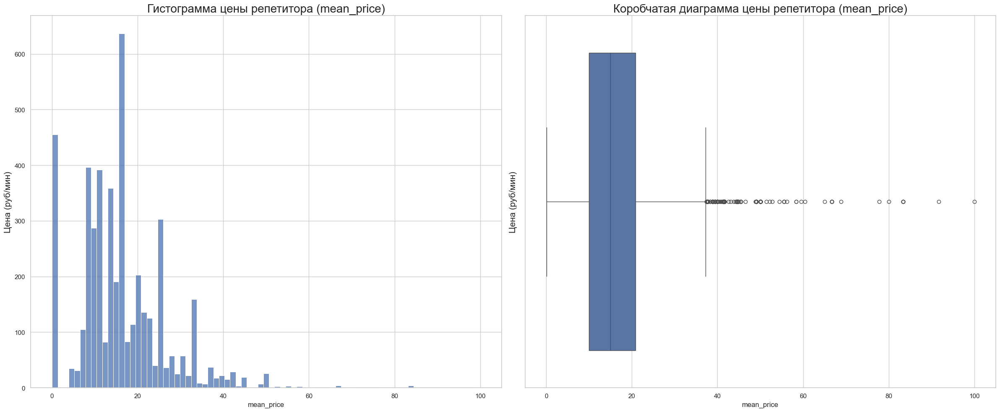

Максимальное значение средней стоимости: 100.0 руб./мин.
Минимальное значение средней стоимости: 0.04166666666666667 руб./мин.


In [84]:
# Настраиваем стиль графиков
sns.set(style = 'whitegrid')



# Задаём параметры графиков
fig, axes = plt.subplots(
    nrows = 1, 
    ncols = 2, 
    figsize = (24, 10)
)



# Строим гистограмму
histplot = sns.histplot(
    data = combined_df,
    x = 'mean_price',
    ax = axes[0]
);

# Название гистограммы
axes[0].set_title('Гистограмма цены репетитора (mean_price)', fontsize = 20)
axes[0].set_ylabel('Цена (руб/мин)', fontsize = 15)




# Строим коробчатую диаграмму
boxplot = sns.boxplot(
    data = combined_df,
    x = 'mean_price',
    ax = axes[1]
);

# Название коробчатой диаграммы
axes[1].set_title('Коробчатая диаграмма цены репетитора (mean_price)', fontsize = 20)
axes[1].set_ylabel('Цена (руб/мин)', fontsize = 15)



# Автоматическое плотное размещение элементов макета
plt.tight_layout()
plt.show()



# Выводим максимальное и минимальное значения средней стоимости репетиторов
print('Максимальное значение средней стоимости: {} руб./мин.'.format(combined_df['mean_price'].max()))
print('Минимальное значение средней стоимости: {} руб./мин.'.format(combined_df['mean_price'].min()))

Построим ещё 2 графика (`boxenplot` и `violinplot`) для наглядности:

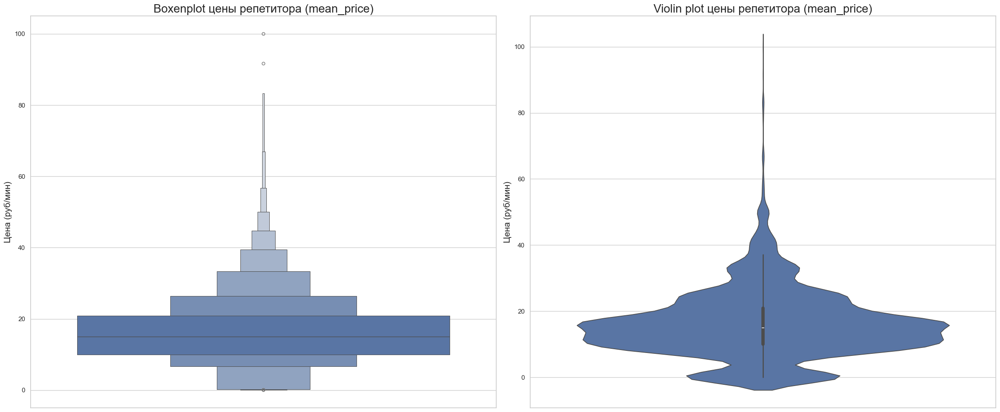

Максимальное значение средней стоимости: 100.0 руб./мин.
Минимальное значение средней стоимости: 0.04166666666666667 руб./мин.


In [85]:
# Настраиваем стиль графиков
sns.set(style = 'whitegrid')

# Создаем фигуру с двумя подграфиками
fig, axes = plt.subplots(1, 2, figsize = (24, 10))



# Построение boxenplot
sns.boxenplot(
    data = combined_df, 
    y = 'mean_price', 
    ax = axes[0]
)

# Название boxenplot
axes[0].set_title('Boxenplot цены репетитора (mean_price)', fontsize = 20)
axes[0].set_ylabel('Цена (руб/мин)', fontsize = 15)



# Построение violin plot
sns.violinplot(
    data = combined_df, 
    y = 'mean_price', 
    ax = axes[1]
)

# Название violinplot
axes[1].set_title('Violin plot цены репетитора (mean_price)', fontsize = 20)
axes[1].set_ylabel('Цена (руб/мин)', fontsize = 15)



# Автоматическое плотное размещение элементов макета
plt.tight_layout()
plt.show()



# Выводим максимальное и минимальное значения средней стоимости репетиторов
print('Максимальное значение средней стоимости: {} руб./мин.'.format(combined_df['mean_price'].max()))
print('Минимальное значение средней стоимости: {} руб./мин.'.format(combined_df['mean_price'].min()))

**Вывод:**

Из полученных визуализаций следует, что максимальная стоимость занятий с репетитором достигает 100 руб./мин. что в полне реально, так как данные преподователи могут обладать значительным опытом, специализированным образованием или уникальными навыками (например, преподавание редких языков, подготовка к олимпиадам или экзаменам), к тому же таких специалистов (судя по графику) очень мало, что подтверждает вывод.

Минимальная стоимость, равная 0.041 рую./мин. кажется подозрительной. Также график имеет левую ассиметрию, что требует преобразования.

## <CENTER> **`3.` Преобразование признаков**

На данном этапе произведё первичное преобразования, в которых из существующих признаков выделим полезную информацию, на базе которой создадим новые.

#### $3.1$

Для начала удалим признак `Unnamed: 0`, так как он копирует столбец `index` и следовательно не несёт никакой полезной информации:

In [86]:
# Удаляем признак
combined_df = combined_df.drop(columns = 'Unnamed: 0', axis = 1)
X_test = X_test.drop(columns = 'Unnamed: 0', axis = 0)

# Выводим информацию по датасету для проверки, что данный признак удалён
display(combined_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6064 entries, 0 to 6063
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   предмет           6064 non-null   object 
 1   ФИО               6064 non-null   object 
 2   tutor_head_tags   6064 non-null   object 
 3   tutor_rating      6064 non-null   float64
 4   tutor_reviews     6064 non-null   int64  
 5   description       6064 non-null   object 
 6   experience_desc   6064 non-null   object 
 7   Education_1       6064 non-null   object 
 8   Desc_Education_1  6064 non-null   object 
 9   status            6064 non-null   object 
 10  experience        6064 non-null   object 
 11  categories        6064 non-null   object 
 12  mean_price        4548 non-null   float64
 13  is_train          6064 non-null   int64  
dtypes: float64(2), int64(2), object(10)
memory usage: 663.4+ KB


None

#### $3.2$

**Рассмотрим признак `ФИО`**.

Выведем уникальные значения данного признака и их количество:

In [87]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "ФИО": {}\n\n'.format(combined_df['ФИО'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "ФИО":\n\n{}'.format(combined_df['ФИО'].value_counts()))

Количество уникальных значений в признаке "ФИО": 5047


Уникальные значения признака "ФИО":

ФИО
Репетитор по информатике Мишина Мария Андреевна - фотография            9
Репетитор по информатике Пустовойт Полина Марковна - фотография         9
Репетитор по информатике Каргин Тимофей Юрьевич - фотография            9
Репетитор по информатике Адаричева Татьяна Николаевна - фотография      9
Репетитор по информатике Заздравных Виталий Игоревич - фотография       9
                                                                       ..
Репетитор по математике  Моргунова Людмила Владимировна - фотография    1
Репетитор по математике  Сидоркин Геннадий Владимирович - фотография    1
Репетитор по математике  Иванов Евгений Игоревич - фотография           1
Репетитор по математике  Иванова Алина Михайловна - фотография          1
Репетитор по математике  Трынгова Лиляна Константиновна - фотография    1
Name: count, Length: 5047, dtype: int64


Данную переменную можно разделить на 2 категориальных признака: 1-й будет обозначать предметную область, 2-й - ФИО преподователя:

In [88]:
# Создаём функцию split_name_subject()
def split_name_subject(string):
    
    parts = string.split(' ')
    subject = ' '.join(parts[: 3])  # первые три слова – 'Репетитор по [предмету]'
    name = ' '.join(parts[3: -2])   # имя и фамилия без '- фотография'
    
    new_string = pd.Series([subject, name]) # объединяем в одну колонку
    
    return new_string




# Создаем новые признаки
combined_df[['Subject', 'Tutor_name']] = combined_df['ФИО'].apply(split_name_subject)
X_test[['Subject', 'Tutor_name']] = X_test['ФИО'].apply(split_name_subject)

print('Уникальные значения признака "Subject":\n\n{}'.format(combined_df['Subject'].value_counts()))
print('-' * 40)
print('\n\n')

print('Уникальные значения признака "Tutor_name":\n\n{}'.format(combined_df['Tutor_name'].value_counts()))
print('-' * 40)


# Исходный признак удаляем
combined_df = combined_df.drop(columns = 'ФИО', axis = 1)
X_test = X_test.drop(columns = 'ФИО', axis = 1)

Уникальные значения признака "Subject":

Subject
Репетитор по математике     4913
Репетитор по информатике    1151
Name: count, dtype: int64
----------------------------------------



Уникальные значения признака "Tutor_name":

Tutor_name
Мишина Мария Андреевна             9
Пустовойт Полина Марковна          9
Каргин Тимофей Юрьевич             9
Адаричева Татьяна Николаевна       9
Заздравных Виталий Игоревич        9
                                  ..
 Моргунова Людмила Владимировна    1
 Сидоркин Геннадий Владимирович    1
 Иванов Евгений Игоревич           1
 Иванова Алина Михайловна          1
 Трынгова Лиляна Константиновна    1
Name: count, Length: 5047, dtype: int64
----------------------------------------


#### $3.3$

**Рассмотрим признак `tutor_head_tags`.**

Выведем уникальные значения данного признака и их количество:

In [89]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "tutor_head_tags": {}\n\n'.format(combined_df['tutor_head_tags'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "tutor_head_tags":\n\n{}'.format(combined_df['tutor_head_tags'].value_counts()))

Количество уникальных значений в признаке "tutor_head_tags": 415


Уникальные значения признака "tutor_head_tags":

tutor_head_tags
['Школьная программа', 'Подготовка к ЕГЭ', 'Подготовка к ОГЭ']                                                                                                                                                                                                              2236
['Школьная программа', 'Подготовка к ОГЭ']                                                                                                                                                                                                                                  1094
['Школьная программа']                                                                                                                                                                                                                                                       647
['Школьная программа', 'Подготовка к ЕГЭ', 'Подго

Создадим категориальный признак, объединяющий все категории. Для этого определим приоритеты и присвоим каждой строке одну основную категорию:

In [90]:
# Создаём функцию 'get_main_category()'
def get_main_category(tags):
    
    
    # Проверяем, если данные строковые, превращаем их в список
    # Если ошибка, оставляем как 'other'
    if isinstance(tags, str):
        try:
            tags = ast.literal_eval(tags)  
        except:
            return 'other' 
    
    
    
    # Убираем пробелы у тегов
    tags_set = set(map(str.strip, tags))
    
    
    
    # Будем определять категории методом пересечения множеств
    if tags_set & {
        'GMAT (математическая часть)', 'SAT (математическая часть)', 'Elementary Mathematics in English',
        'A-level', 'Mathematik auf Deutsch'
        }:
        
        return 'intl_exams'
    
    
    elif tags_set & tags_set & {'Подготовка к олимпиадам', 'ТЮФ', 'Математическая логика'}:
        return 'olympiad_prep'
    
    
    elif tags_set & {
        'Математический анализ', 'Линейная алгебра', 'Дифференциальные уравнения',
        'Теория вероятностей и мат. статистика', 'Аналитическая геометрия',
        'Дискретная математика'
        }:
        
        return 'higher_math'
    
    
    elif tags_set & {'Школьная программа', 'Подготовка к ОГЭ', 'Подготовка к ЕГЭ'}:
        return 'school_program'
    
    
    else:
        return 'other'




# Добавляем новый категориальный признак
combined_df['tutor_main_category'] = combined_df['tutor_head_tags'].apply(get_main_category)
X_test['tutor_main_category'] = X_test['tutor_head_tags'].apply(get_main_category)

print('Уникальные значения признака "tutor_main_category":\n\n{}'.format(combined_df['tutor_main_category'].value_counts()))
print('-' * 40)

# Исходный признак удаляем
combined_df = combined_df.drop(columns = 'tutor_head_tags', axis = 1)
X_test = X_test.drop(columns = 'tutor_head_tags', axis = 1)

Уникальные значения признака "tutor_main_category":

tutor_main_category
school_program    4487
olympiad_prep      937
higher_math        505
intl_exams         122
other               13
Name: count, dtype: int64
----------------------------------------


#### $3.4$

**Рассмотрим признак `experience`.**

Выведем уникальные значения данного признака и их количество:

In [91]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "experience": {}\n\n'.format(combined_df['experience'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "experience":\n\n{}'.format(combined_df['experience'].value_counts()))

Количество уникальных значений в признаке "experience": 56


Уникальные значения признака "experience":

experience
 4 года       646
 5 лет        548
 6 лет        537
 3 года       497
 2 года       390
 7 лет        369
 8 лет        311
 9 лет        302
 10 лет       242
 1 год        231
 11 лет       178
 14 лет       175
 12 лет       153
 13 лет       149
 15 лет       107
 20 лет        89
 18 лет        79
 16 лет        73
 29 лет        71
 27 лет        63
 25 лет        60
 24 года       60
 22 года       53
 28 лет        51
 17 лет        48
 21 год        46
 23 года       45
 30 лет        42
 19 лет        39
 33 года       37
нет данных     35
 26 лет        34
 31 год        29
 32 года       29
 37 лет        26
 34 года       25
 38 лет        24
 45 лет        23
 35 лет        19
 40 лет        18
 36 лет        16
 41 год        15
 44 года       14
 42 года       13
 39 лет        13
 43 года       12
 47 лет         7
 46 лет         7
 48 лет         5
 5

Из данного признака можно создать 2 дополнительных: 1-й числовой (количество лет стажа), 2-й категориальный (категории от 'новичёк' до 'опытный' в зависимости от стажа работы):

In [92]:
# Заменяем значения 'нет данных' на '0 лет'
combined_df['experience'] = combined_df['experience'].replace('нет данных', '0 лет')
X_test['experience'] = X_test['experience'].replace('нет данных', '0 лет')

# Создаём признак 'experience_numeric' (извлекаем числовое значение из строки)
combined_df['experience_numeric'] = combined_df['experience'].str.extract('(\d+)').astype(int)
X_test['experience_numeric'] = X_test['experience'].str.extract('(\d+)').astype(int)



# Определяем категории
bins = [0, 1, 3, 10, float('inf')]
labels = ['Новичок', 'Малоопытный', 'Опытный', 'Профессионал']

# Создаём признак 'experience_category' (создаём границы: 0-1, 2-3, 4-10, 11+ лет)
combined_df['experience_category'] = pd.cut(combined_df['experience_numeric'], bins = bins, labels = labels, right = False)
X_test['experience_category'] = pd.cut(X_test['experience_numeric'], bins = bins, labels = labels, right = False)



# Выводим результаты
print('Уникальные значения признака "experience_category":\n\n{}'.format(combined_df['experience_category'].value_counts()))
print('-' * 40)
print('\n\n')

print('Уникальные значения признака "experience_numeric":\n\n{}'.format(combined_df['experience_numeric'].value_counts()))
print('-' * 40)


# Исходный признак удаляем
combined_df = combined_df.drop(columns = 'experience', axis = 1)
X_test = X_test.drop(columns = 'experience', axis = 1)

Уникальные значения признака "experience_category":

experience_category
Опытный         3210
Профессионал    2198
Малоопытный      621
Новичок           35
Name: count, dtype: int64
----------------------------------------



Уникальные значения признака "experience_numeric":

experience_numeric
4     646
5     548
6     537
3     497
2     390
7     369
8     311
9     302
10    242
1     231
11    178
14    175
12    153
13    149
15    107
20     89
18     79
16     73
29     71
27     63
25     60
24     60
22     53
28     51
17     48
21     46
23     45
30     42
19     39
33     37
0      35
26     34
31     29
32     29
37     26
34     25
38     24
45     23
35     19
40     18
36     16
41     15
44     14
42     13
39     13
43     12
47      7
46      7
48      5
50      2
53      2
52      1
68      1
55      1
51      1
54      1
Name: count, dtype: int64
----------------------------------------


#### $3.5$

**Рассмотрим признак `categories`.**

Выведем уникальные значения данного признака и их количество:

In [93]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "categories": {}\n\n'.format(combined_df['categories'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "categories":\n\n{}'.format(combined_df['categories'].value_counts()))

Количество уникальных значений в признаке "categories": 206


Уникальные значения признака "categories":

categories
['Школьники с 5 по 9 класс', 'Школьники с 10 по 11 класс, студенты колледжей и техникумов, абитуриенты']                                                                                                        1680
['Школьники с 5 по 9 класс']                                                                                                                                                                                     806
['Школьники с 1 по 4 класс', 'Школьники с 5 по 9 класс']                                                                                                                                                         475
['Школьники с 1 по 4 класс', 'Школьники с 5 по 9 класс', 'Школьники с 10 по 11 класс, студенты колледжей и техникумов, абитуриенты']                                                                             418
['Школьники с 5 по 9 класс', 'Ш

Создадим новый признак, в котором каждый список (значение признака) ранжируем по категориям:

In [94]:
# Преобразуем строковые списки в настоящие списки
combined_df['categories'] = combined_df['categories'].apply(lambda x: eval(x) if isinstance(x, str) else x)
X_test['categories'] = X_test['categories'].apply(lambda x: eval(x) if isinstance(x, str) else x)


# Считаем количество элементов в списке
combined_df['num_categories'] = combined_df['categories'].apply(len)
X_test['num_categories'] = X_test['categories'].apply(len)


# Создадим бины (группы) по количеству категорий
bins = [0, 1, 2, 5, float('inf')]
labels = ['Одна категория', 'Две категории', '3-5 категорий', '6+ категорий']


# Применяем разбиение
combined_df['category_range'] = pd.cut(combined_df['num_categories'], bins = bins, labels = labels)
X_test['category_range'] = pd.cut(X_test['num_categories'], bins = bins, labels = labels)


# Преобразуем в категориальный тип
combined_df['category_range'] = combined_df['category_range'].astype('category')
X_test['category_range'] = X_test['category_range'].astype('category')


# Удаляем промежуточный числовой столбец и исходный признак
combined_df.drop(columns = ['num_categories', 'categories'], inplace = True)
X_test.drop(columns = ['num_categories', 'categories'], inplace = True)




# Выводим результат
print('Уникальные значения признака "category_range":\n\n{}'.format(combined_df['category_range'].value_counts()))
print('-' * 40)

Уникальные значения признака "category_range":

category_range
3-5 категорий     2387
Две категории     2367
Одна категория    1020
6+ категорий       290
Name: count, dtype: int64
----------------------------------------


#### $3.6$

**Рассмотрим признак `Education_1`.**

Выведем уникальные значения данного признака и их количество:

In [95]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "Education_1": {}\n\n'.format(combined_df['Education_1'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "Education_1":\n\n{}'.format(combined_df['Education_1'].value_counts()))

Количество уникальных значений в признаке "Education_1": 1599


Уникальные значения признака "Education_1":

Education_1
 Санкт-Петербургский государственный университет                                        224
 Санкт-Петербургский государственный политехнический университет                        124
 Российский государственный педагогический университет имени А. И. Герцена              104
Репетитор не предоставил информацию об образовании                                       93
 МГТУ им. Н.Э. Баумана                                                                   86
                                                                                       ... 
 Новосибирский Государственный Педагогический Университет                                 1
 Институт технологии и бизнеса                                                            1
 Московский государственный открытый педагогический университет имени М.А. Шолохова       1
 Шанхайский университет                            

Из данного признака получим 2 дополнительных: в первом признаке ВУЗы будут сгруппированы по количеству, 2-й признак будет обозначать тип учреждения (Технический, Медицинский и т. д.).

1. Группируем редкие университеты:

In [96]:
# Определяем порог частоты (например, оставляем вузы с >50 повторений)
threshold = 50

# Вычисляем частоту встречаемости
education_counts = combined_df['Education_1'].value_counts()
education_counts_test = X_test['Education_1'].value_counts()


# Группируем редкие вузы в "Другие"
combined_df['Education_grouped'] = combined_df['Education_1'].apply(
    lambda x: x if education_counts[x] > threshold else 'Другие'
)

# Группируем редкие вузы в "Другие"
X_test['Education_grouped'] = X_test['Education_1'].apply(
    lambda x: x if education_counts_test[x] > threshold else 'Другие'
)



# Преобразуем признак в категориальный
combined_df['Education_grouped'] = combined_df['Education_grouped'].astype('category')
X_test['Education_grouped'] = X_test['Education_grouped'].astype('category')

2. Определяем тип университета:

In [97]:
# Создаём функцию 'classify_university'
def classify_university(name):
    name = name.lower()
    if 'технолог' in name or 'техн' in name or 'политех' in name:
        return 'Технический вуз'
    elif 'педагог' in name or 'гуманитар' in name:
        return 'Педагогический/Гуманитарный вуз'
    elif 'медицин' in name or 'мед' in name:
        return 'Медицинский вуз'
    elif 'институт' in name:
        return 'Институт'
    elif 'университет' in name:
        return 'Классический университет'
    elif 'академия' in name:
        return 'Академия'
    elif 'не предоставил' in name:
        return 'Не указано'
    else:
        return 'Другие'




# Применяем функцию
combined_df['Education_type'] = combined_df['Education_1'].apply(classify_university)
X_test['Education_type'] = X_test['Education_1'].apply(classify_university)


# Преобразуем в категориальный
combined_df['Education_type'] = combined_df['Education_type'].astype('category')
X_test['Education_type'] = X_test['Education_type'].astype('category')

Выводим результаты:

In [98]:
# Выводим результаты
print('Уникальные значения признака "Education_grouped":\n\n{}'.format(combined_df['Education_grouped'].value_counts()))
print('-' * 120)
print('\n\n')

print('Уникальные значения признака "Education_type":\n\n{}'.format(combined_df['Education_type'].value_counts()))
print('-' * 50)


# Исходный признак удаляем
combined_df = combined_df.drop(columns = 'Education_1', axis = 1)

Уникальные значения признака "Education_grouped":

Education_grouped
Другие                                                                                                           4965
 Санкт-Петербургский государственный университет                                                                  224
 Санкт-Петербургский государственный политехнический университет                                                  124
 Российский государственный педагогический университет имени А. И. Герцена                                        104
Репетитор не предоставил информацию об образовании                                                                 93
 МГТУ им. Н.Э. Баумана                                                                                             86
 Санкт-Петербургский политехнический университет Петра Великого                                                    85
 МГУ им. М.В. Ломоносова                                                                                 

#### $3.7$

**Рассмотрим признак `Desc_Education_1`.**

Выведем уникальные значения данного признака и их количество:

In [99]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "Desc_Education_1": {}\n\n'.format(combined_df['Desc_Education_1'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "Desc_Education_1":\n\n{}'.format(combined_df['Desc_Education_1'].value_counts()))

Количество уникальных значений в признаке "Desc_Education_1": 4784


Уникальные значения признака "Desc_Education_1":

Desc_Education_1
нет данных                                                                                                                                                                     94
 Год окончания: 2026, Факультет: Институт информационных технологий, Специальность: Программная инженерия, Квалификация: Бакалавр                                              16
 Год окончания: 2004, Факультет: Математический, Специальность: Математика (с доп. спец. Информатика), Квалификация: Учитель математики и информатики                          10
 Год окончания: 2020, Факультет: Институт прикладной математики и компьютерных наук, Специальность: Прикладная математика и информатика, Квалификация: Бакалавр                10
 Год окончания: 1991, Факультет: Электронное машиностроение, Специальность: Электронное машиностроение, Квалификация: Инженер электронной техники       

С помощью регулярных выражений разобьем `Desc_Education_1` на отдельные категориальные признаки:

* Год окончания (`year_graduation`);

* Факультет (`faculty`);

* Специальность (`specialty`);

* Квалификация (`qualification`).

In [100]:
# Регулярное выражение для извлечения данных
pattern = r'Год окончания: (\d+), Факультет: (.*?), Специальность: (.*?), Квалификация: (.+)'

# Разбиваем признак на 4 новых
combined_df[['year_graduation', 'faculty', 'specialty', 'qualification']] = combined_df['Desc_Education_1'].str.extract(pattern).astype(object)
X_test[['year_graduation', 'faculty', 'specialty', 'qualification']] = X_test['Desc_Education_1'].str.extract(pattern).astype(object)



# Заполняем образовавшиеся пропуски
combined_df[['year_graduation', 'faculty', 'specialty', 'qualification']] = (
    combined_df[['year_graduation', 'faculty', 'specialty', 'qualification']].fillna('unknown')
)

# Заполняем образовавшиеся пропуски
X_test[['year_graduation', 'faculty', 'specialty', 'qualification']] = (
    X_test[['year_graduation', 'faculty', 'specialty', 'qualification']].fillna('unknown')
)



# Исходный признак удаляем
combined_df = combined_df.drop(columns = 'Desc_Education_1', axis = 1)
X_test = X_test.drop(columns = 'Desc_Education_1', axis = 1)

Выводим результат:

In [101]:
# Выводим результаты
print('Уникальные значения признака "year_graduation":\n\n{}'.format(combined_df['year_graduation'].value_counts()))
print('-' * 40)
print('\n\n')

print('Уникальные значения признака "faculty":\n\n{}'.format(combined_df['faculty'].value_counts()))
print('-' * 70)
print('\n\n')

print('Уникальные значения признака "specialty":\n\n{}'.format(combined_df['specialty'].value_counts()))
print('-' * 90)
print('\n\n')

print('Уникальные значения признака "qualification":\n\n{}'.format(combined_df['qualification'].value_counts()))
print('-' * 80)

Уникальные значения признака "year_graduation":

year_graduation
unknown    3149
2022        287
2020        218
2024        185
2025        174
           ... 
1976          1
1974          1
1967          1
1969          1
1968          1
Name: count, Length: 65, dtype: int64
----------------------------------------



Уникальные значения признака "faculty":

faculty
unknown                                              3149
Физико-математический                                  87
физико-математический факультет                        85
Физический факультет                                   68
Математический                                         58
                                                     ... 
институт транспортных систем                            1
Информационные технологии и анализ больших данных       1
Международного бизнеса и торговли                       1
Институт кибербезопасности и цифровых технологий        1
бизнес-школа                                    

#### $3.8$

**Рассмотрим признак `status`.**

Выведем уникальные значения данного признака и их количество:

In [102]:
# Выводим количество уникальных значений
print('Количество уникальных значений в признаке "status": {}\n\n'.format(combined_df['status'].nunique()))

# Выведем уникальные значения
print('Уникальные значения признака "status":\n\n{}'.format(combined_df['status'].value_counts()))

Количество уникальных значений в признаке "status": 11


Уникальные значения признака "status":

status
Частный преподаватель                                                                                 3133
Студент                                                                                               1709
Школьный преподаватель                                                                                 753
Университетский преподаватель                                                                          176
Частный преподаватель, Студент                                                                         129
Аспирант или ординатор очной формы обучения                                                             67
Университетский преподаватель, Школьный преподаватель                                                   53
Аспирант или ординатор очной формы обучения, Частный преподаватель                                      22
Университетский преподаватель, Аспирант 

Строки преобразуем в списки, затем произведём ранжировку по длине списка:

In [103]:
# Функция для ранжирования по длине списка
def rank_by_length(status):
    
    # Превращаем строку в список
    status_list = status.split(', ')
    
    # Ранжируем по длине списка
    if len(status_list) == 1:
        return 'Одностатусный преподаватель'
    else:
        return 'Многостатусный преподаватель'
    
    
    
# Применяем функцию к колонке 'status'
combined_df['status'] = combined_df['status'].apply(rank_by_length)
X_test['status'] = X_test['status'].apply(rank_by_length)

# Выводим результат
print('Уникальные значения признака "status":\n\n{}'.format(combined_df['status'].value_counts()))
print('-' * 40)

Уникальные значения признака "status":

status
Одностатусный преподаватель     5838
Многостатусный преподаватель     226
Name: count, dtype: int64
----------------------------------------


#### $3.9$

Создадим признак, обозначающий взаимосвязь между опытом и рейтингом репетитора:

In [104]:
# Создание признака
combined_df['experience_rating_interaction'] = combined_df['experience_numeric'] * combined_df['tutor_rating']
X_test['experience_rating_interaction'] = X_test['experience_numeric'] * X_test['tutor_rating']


# Проверка результата
print('Первые 5 строк с новым признаком "experience_rating_interaction":\n')
display(combined_df[['experience_numeric', 'tutor_rating', 'experience_rating_interaction']].head())

Первые 5 строк с новым признаком "experience_rating_interaction":



,experience_numeric,tutor_rating,experience_rating_interaction
0,31,5.0,155.0
1,8,4.0,32.0
2,11,0.0,0.0
3,5,4.0,20.0
4,19,0.0,0.0


Посмотрим на распределение признака `experience_rating_interaction`:

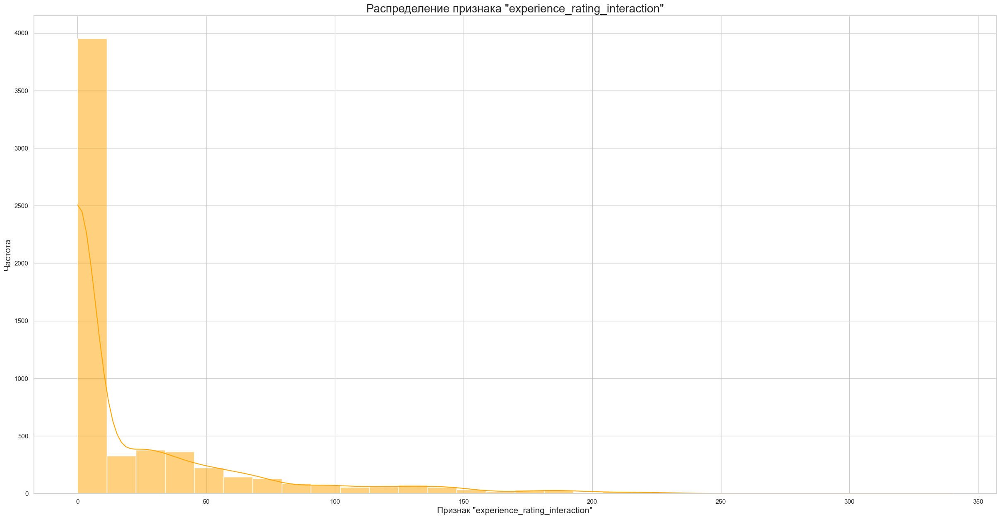

In [105]:
# Создаём график
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    combined_df['experience_rating_interaction'],
    bins = 30,
    kde = True, 
    color = 'orange'
)

plt.title('Распределение признака "experience_rating_interaction"', fontsize = 20)
plt.xlabel('Признак "experience_rating_interaction"', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()

Распределение `experience_rating_interaction` сильно скошено вправо, что может негативно сказаться на обучении модели. Попробуем его прологарифмировать:

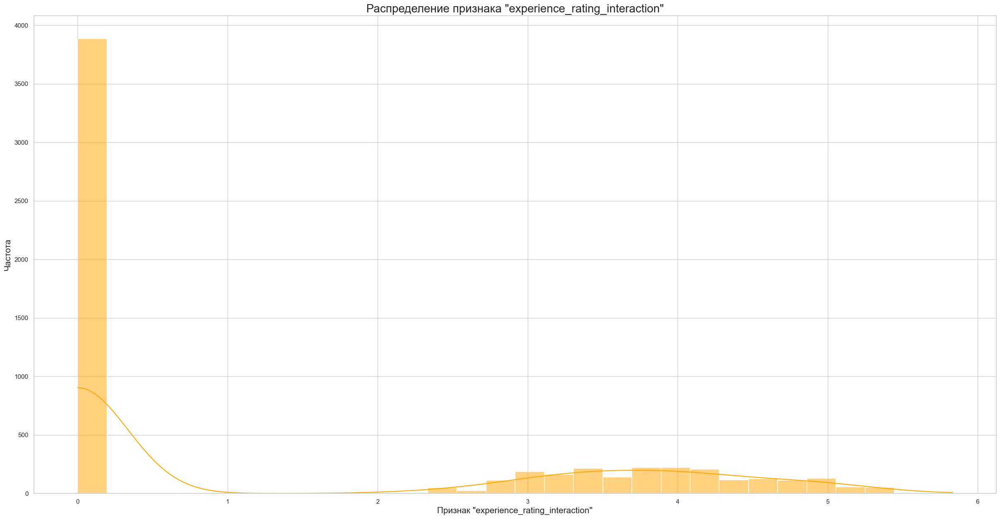

In [106]:
# Логарифмирование "price_per_experience" (добавляем 1, чтобы избежать log(0))
combined_df['experience_rating_interaction'] = np.log(combined_df['experience_rating_interaction'] + 1)
X_test['experience_rating_interaction'] = np.log(X_test['experience_rating_interaction'] + 1)



# Повторно строим визуализацию
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    combined_df['experience_rating_interaction'],
    bins = 30,
    kde = True, 
    color = 'orange'
)

plt.title('Распределение признака "experience_rating_interaction"', fontsize = 20)
plt.xlabel('Признак "experience_rating_interaction"', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()

Пик около 0 скорее всего говорит о том, что большое количество репетиторов имеют либо очень маленький опыт, либо низкий рейтинг (например, если у репетитора нет отзывов).

#### $3.10$

Создадим признак, обозначающий зависимость цены от стажа:

In [46]:
# Создание признака с обработкой деления на ноль
# Если experience_numeric == 0, установим price_per_experience = 0 или другое значение
combined_df['price_per_experience'] = np.where(
    combined_df['experience_numeric'] != 0,
    combined_df['mean_price'] / combined_df['experience_numeric'],
    0
)



# Проверка результата
print('Первые 5 строк с новым признаком "price_per_experience":\n')
display(combined_df[['mean_price', 'experience_numeric', 'price_per_experience']].head())

Первые 5 строк с новым признаком "price_per_experience":



,mean_price,experience_numeric,price_per_experience
0,16.666667,31,0.537634
1,11.666667,8,1.458333
2,23.333333,11,2.121212
3,0.116667,5,0.023333
4,16.666667,19,0.877193


Посмотрим на распределение признака `price_per_experience`:

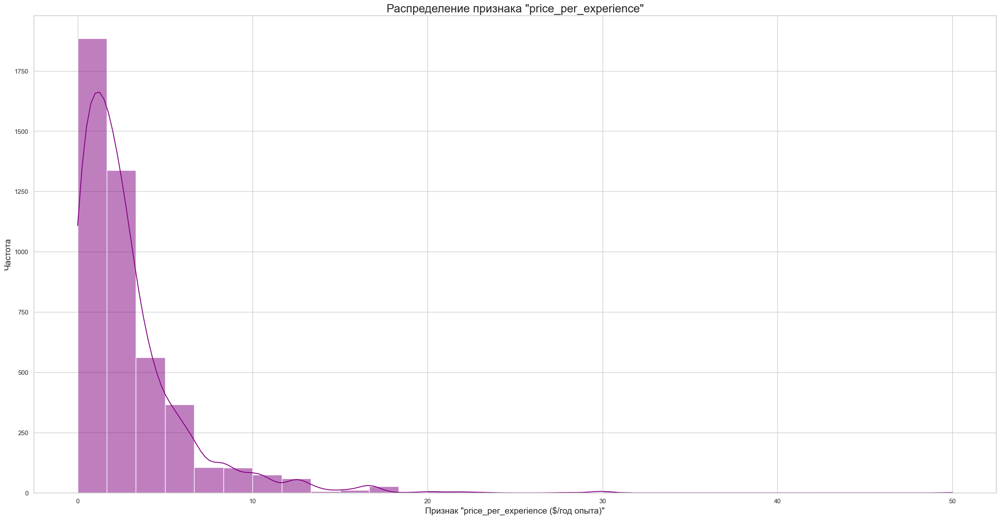

In [47]:
# Создаём график
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    combined_df['price_per_experience'],
    bins = 30,
    kde = True, 
    color = 'purple'
)

plt.title('Распределение признака "price_per_experience"', fontsize = 20)
plt.xlabel('Признак "price_per_experience ($/год опыта)"', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()

Распределение `price_per_experience` сильно скошено вправо, что может негативно сказаться на обучении модели. Попробуем его прологарифмировать:

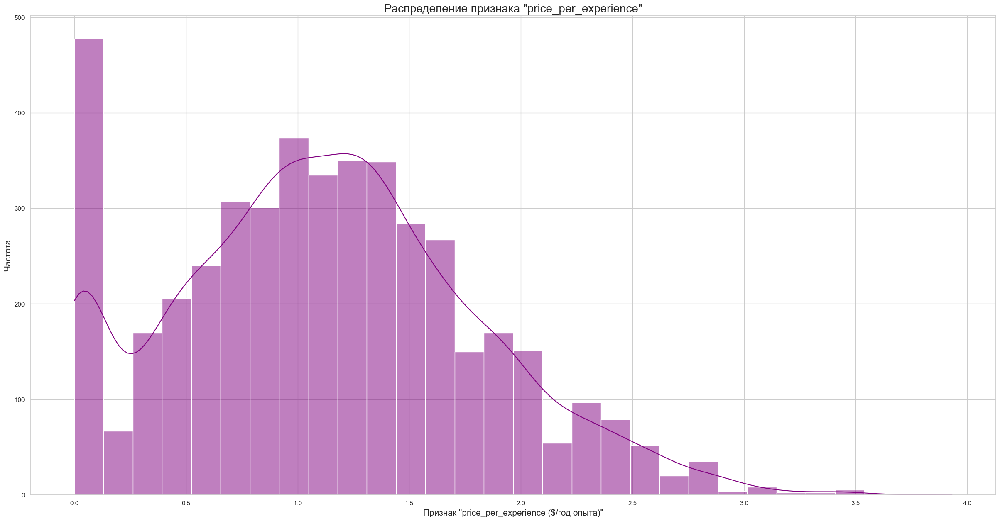

In [48]:
# Логарифмирование "price_per_experience" (добавляем 1, чтобы избежать log(0))
combined_df['price_per_experience'] = np.log(combined_df['price_per_experience'] + 1)



# Повторно строим визуализацию
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    combined_df['price_per_experience'],
    bins = 30,
    kde = True, 
    color = 'purple'
)

plt.title('Распределение признака "price_per_experience"', fontsize = 20)
plt.xlabel('Признак "price_per_experience ($/год опыта)"', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()

Заполним образовавшиеся пропуски в созданном признаке:

In [49]:
# Заполняем пропуски в 'price_per_experience' медианой по 'tutor_main_category'
combined_df['price_per_experience'] = combined_df.groupby('tutor_main_category')['price_per_experience'].transform(lambda x: x.fillna(x.median()))

# Проверим наличие пропусков
print(combined_df['price_per_experience'].isnull().sum())

0


Теперь распределение нормальное и данный признак можно использовать для обучения модели.

#### $3.11$

Удалим лишние признаки:

In [107]:
# Создаём список столбцов для удаления
features_to_delete = ['предмет', 'description', 'experience_desc', 'Tutor_name']

# Удаляем признаки
combined_df = combined_df.drop(columns = features_to_delete)
X_test = X_test.drop(columns = features_to_delete)

# Выводим размеры таблицы
print('Данные имеют следующую размерность:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(combined_df.shape[0], combined_df.shape[1]))
print('-' * 40)
print('\n\n')


# Выводим информацию по оставшимся признакам
display(combined_df.info())

Данные имеют следующую размерность:

Количество строк: 6064;
Количество признаков (столбцов): 17.
----------------------------------------



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6064 entries, 0 to 6063
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   tutor_rating                   6064 non-null   float64 
 1   tutor_reviews                  6064 non-null   int64   
 2   status                         6064 non-null   object  
 3   mean_price                     4548 non-null   float64 
 4   is_train                       6064 non-null   int64   
 5   Subject                        6064 non-null   object  
 6   tutor_main_category            6064 non-null   object  
 7   experience_numeric             6064 non-null   int32   
 8   experience_category            6064 non-null   category
 9   category_range                 6064 non-null   category
 10  Education_grou

None

## <CENTER> **`4.` Разведывательный анализ данных (EDA)**

В данной части проекта мы:

* изучаем сгенерированный набор данных;

* дополним наш анализ визуализациями, иллюстрирующими исследование.

#### $4.1$

**Распределение целевой переменной `mean_price`.**

Построим гистограмму:

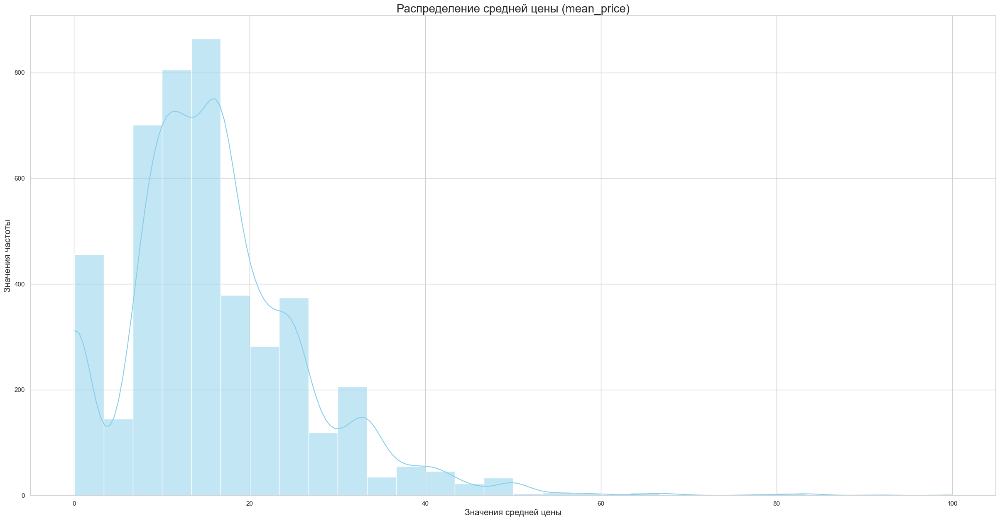

In [48]:
# Создаём график
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    combined_df['mean_price'], 
    kde = True, 
    bins = 30, 
    color = 'skyblue'
)

plt.title('Распределение средней цены (mean_price)', fontsize = 20)
plt.xlabel('Значения средней цены', fontsize = 15)
plt.ylabel('Значения частоты', fontsize = 15)
plt.grid(True)
plt.show()

**Вывод:**

Из полученного графика следует, что распределение средней цены имеет выраженный перекос с большинством значений в нижнем диапазоне. Это указывает на то, что по большей части преобладают услуги с низкой средней стоимостью.

#### $4.2$

**Построим зависимости средней стоимости `mean_price` по категории репетитора (`tutor_main_category`).**

Строим сводную таблицу:

In [49]:
# Создаём сводную таблицу признака "mean_price" по "tutor_main_category"
pivot_category = pd.pivot_table(
    combined_df,
    values = 'mean_price',
    index = 'tutor_main_category',
    aggfunc = 'mean',
    fill_value = 0
).reset_index()

# Выводим таблицу
print(f'Сводная таблица: "mean_price" по "tutor_main_category":\n\n{pivot_category}')

Сводная таблица: "mean_price" по "tutor_main_category":

  tutor_main_category  mean_price
0         higher_math   14.742848
1          intl_exams   28.040181
2       olympiad_prep   17.236126
3               other   17.833333
4      school_program   15.825304


Построим визуализацию:

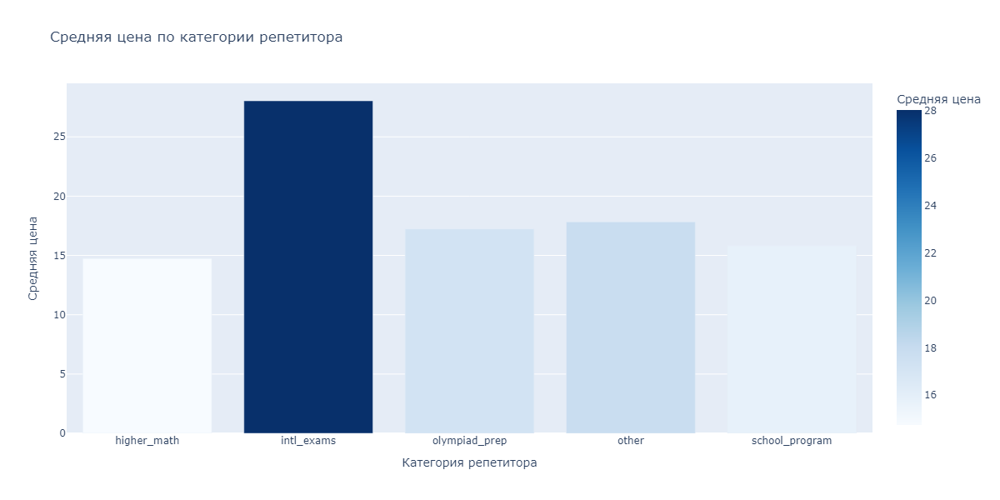

In [50]:
# Строим столбчатую диаграмму
fig = px.bar(
    pivot_category,
    x = 'tutor_main_category',
    y = 'mean_price',
    title = 'Средняя цена по категории репетитора',
    width = 1200,
    height = 600,
    
    labels = {
        'mean_price': 'Средняя цена',
        'tutor_main_category': 'Категория репетитора'
    },
    
    color = 'mean_price',
    color_continuous_scale = 'Blues'
)



# Отображаем график
fig.show('png')

Сопоставим данный график с круговой диаграммой:

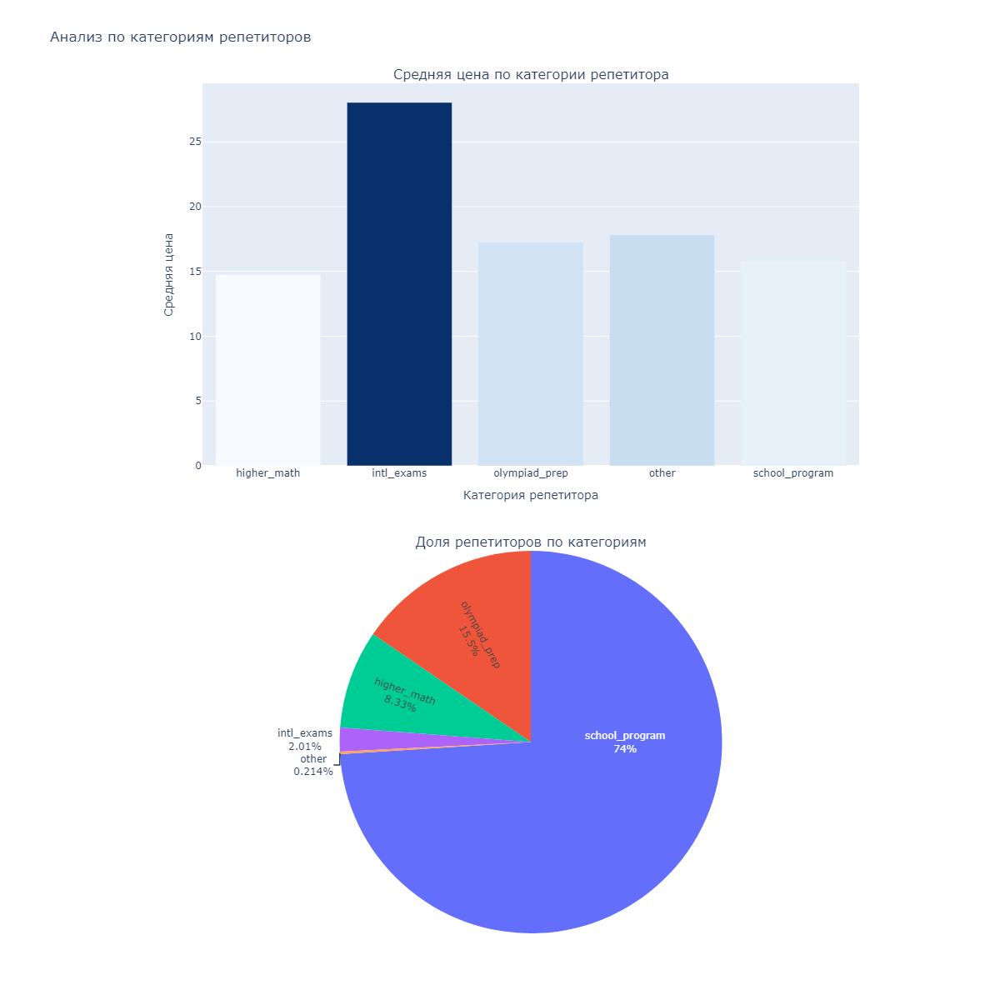

In [51]:
# Подсчёт количества репетиторов в каждой категории для круговой диаграммы
category_counts = combined_df['tutor_main_category'].value_counts()


# Создаём subplot: столбчатая диаграмма сверху, круговая снизу
fig = make_subplots(
    rows = 2, cols = 1, 
    specs = [[{'type': 'bar'}], [{'type': 'pie'}]], 
    subplot_titles = ['Средняя цена по категории репетитора', 'Доля репетиторов по категориям'],
    vertical_spacing = 0.1
)  



# Столбчатая диаграмма
fig.add_trace(
    go.Bar(
        x = pivot_category['tutor_main_category'], 
        y = pivot_category['mean_price'], 
        name = 'Средняя цена',
        marker_color = pivot_category['mean_price'], 
        marker_colorscale = 'Blues'
    ),
    
    row = 1, col = 1
)



# Круговая диаграмма 
fig.add_trace(
    go.Pie(
        labels = category_counts.index, 
        values = category_counts.values, 
        name = 'Доля репетиторов',
        textinfo = 'label+percent', 
        insidetextorientation = 'radial'
    ),
    
    row = 2, col = 1
)



# Настраиваем layout
fig.update_layout(
    title_text = 'Анализ по категориям репетиторов',
    height = 1200,  
    width = 1200,
    showlegend = False
)



# Настраиваем оси для столбчатой диаграммы
fig.update_xaxes(title_text = 'Категория репетитора', row = 1, col = 1)
fig.update_yaxes(title_text = 'Средняя цена', row = 1, col = 1)

# Отображаем график
fig.show('png')

**Вывод:**

По полученным данным можно заключить, что средняя цена услуг различается в зависимости от категории преподавания. Самая высокая средняя цена наблюдается в категории `"intl_exams"` ($28.04$), а самая низкая — в категории `"higher_math"` ($14.74$). Остальные категории имеют среднюю цену в диапазоне $15.8$–$17.8$.

#### $4.3$


**Построим зависимости средней стоимости `mean_price` по опыту (`experience_category`) и статусу репетитора (`status`).**

Строим сводную таблицу:

In [52]:
# Создаём сводную таблицу признака "mean_price" по "experience_category" и "status"
pivot_exp_status = pd.pivot_table(
    combined_df,
    values = 'mean_price',
    index = 'experience_category',
    columns = 'status',
    aggfunc = 'mean',
    fill_value = 0
)


# Выводим таблицу
print(f'Сводная таблица: "mean_price" по "experience_category" и "status":\n\n{pivot_exp_status}')

Сводная таблица: "mean_price" по "experience_category" и "status":

status               Многостатусный преподаватель  Одностатусный преподаватель
experience_category                                                           
Новичок                                  0.000000                    11.845778
Малоопытный                             17.775189                    12.803473
Опытный                                 20.834404                    15.219987
Профессионал                            27.491695                    17.991257


C:\Users\User\AppData\Local\Temp\ipykernel_16240\1612405249.py:2: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



Построим визуализацию:

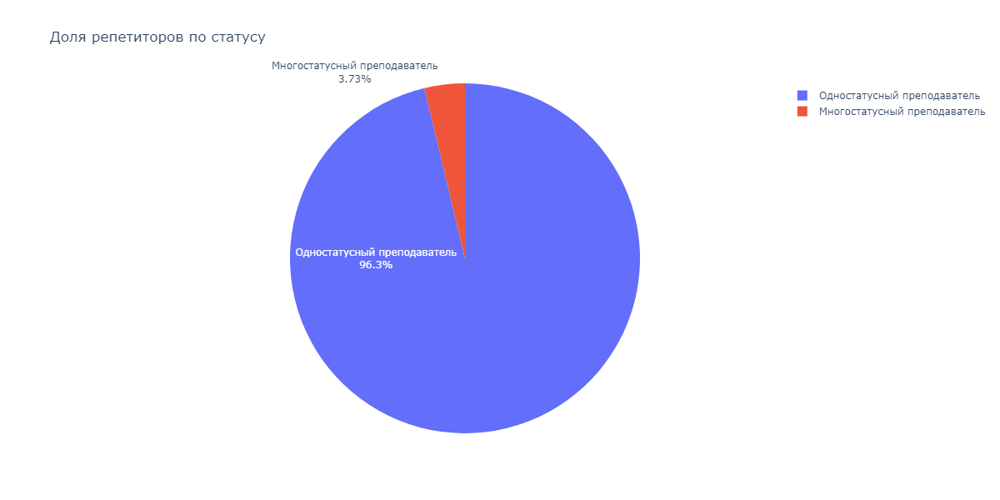

In [53]:
# Рассчитываем уникальные значения статуса
status_counts = combined_df['status'].value_counts()


# Строим круговую диаграмму доли репетиторов по "status"
fig = go.Figure(
    data = [
        go.Pie(
            labels = status_counts.index,
            values = status_counts.values,
            textinfo = 'label+percent',
            insidetextorientation = 'radial'
        )
    ]
)

# Настройка макета
fig.update_layout(
    title = 'Доля репетиторов по статусу',
    width = 1200,
    height = 600
)

# Отображаем график
fig.show('png')

**Вывод:**

Многостатусные преподаватели предлагают свои услуги по более высокой цене, особенно в категориях с большим опытом.

#### $4.4$

**Построим точечную диаграмму зависимости `mean_price` и `tutor_rating`**:

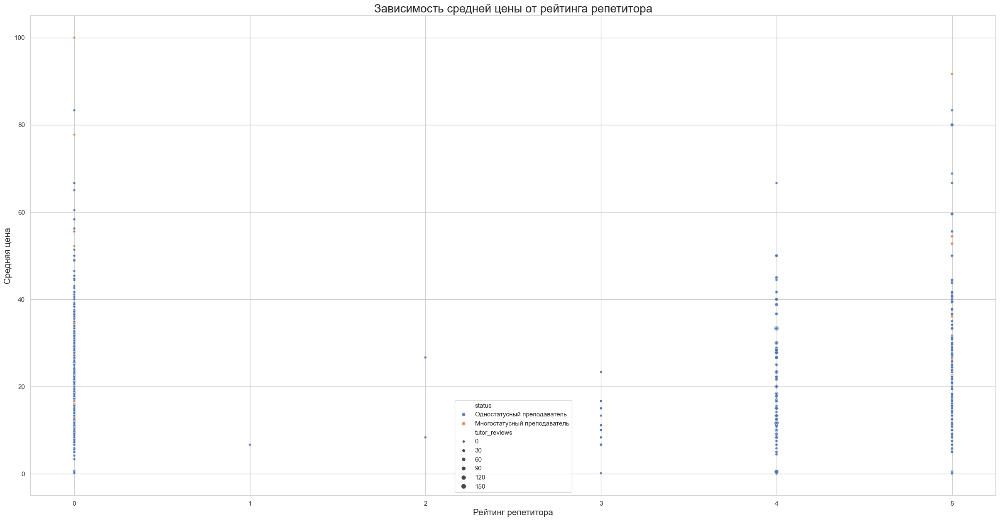

In [54]:
# Задаём размер
plt.rcParams['figure.figsize'] = (30, 15)


# Строим точечную диаграмму
sns.scatterplot(
    data = combined_df,
    x = 'tutor_rating',
    y = 'mean_price',
    hue = 'status',
    size = 'tutor_reviews',
    alpha = 0.9
)


# Задаём названия осей
plt.title('Зависимость средней цены от рейтинга репетитора', fontsize = 20)
plt.xlabel('Рейтинг репетитора', fontsize = 15)
plt.ylabel('Средняя цена', fontsize = 15)

# Отображаем график
plt.show()

**Вывод:**

Как видно из полученной диаграммы, репетиторы с высоким рейтингом и большим количеством отзывов предлагают свои услуги по более высокой цене, при этом многостатусные преподаватели удерживают ценовую премию на всех уровнях рейтинга.

#### $4.5$

**Построим точечную диаграмму зависимости `mean_price` и `experience_numeric`**:

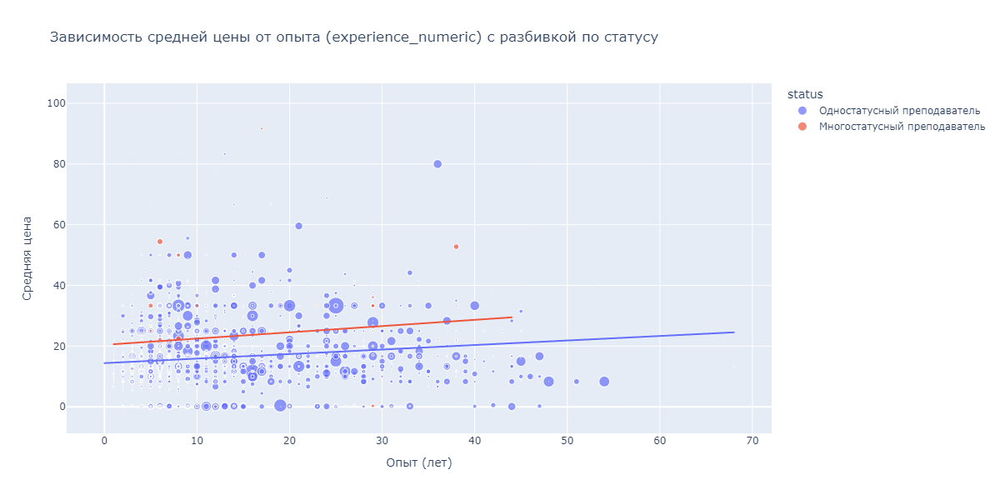

In [55]:
# Точечная диаграмма с регрессией
fig = px.scatter(
    combined_df, 
    x = 'experience_numeric', 
    y = 'mean_price', 
    color = 'status',  
    trendline = 'ols', 
    color_continuous_scale = 'Viridis',
    
    labels = {
        'experience_numeric': 'Опыт (лет)',
        'mean_price': 'Средняя цена'
    },
    
    size = 'tutor_reviews',
    hover_data = ['tutor_main_category'],
    title = 'Зависимость средней цены от опыта (experience_numeric) с разбивкой по статусу'
)



# Настраиваем layout
fig.update_layout(
    height = 600, 
    width = 1200,
    coloraxis_colorbar_title = 'Средняя цена'
)


# Отображаем график
fig.show('png')

**Вывод:**

Опыт оказывает умеренное влияние на среднюю цену услуг преподавателей, однако в данных присутствует значительный разброс, что может быть связано с другими факторами, влияющими на цену.

#### $4.6$

**Построим распределение средней стоимости `mean_price` по категории опыта `experience_category`**:

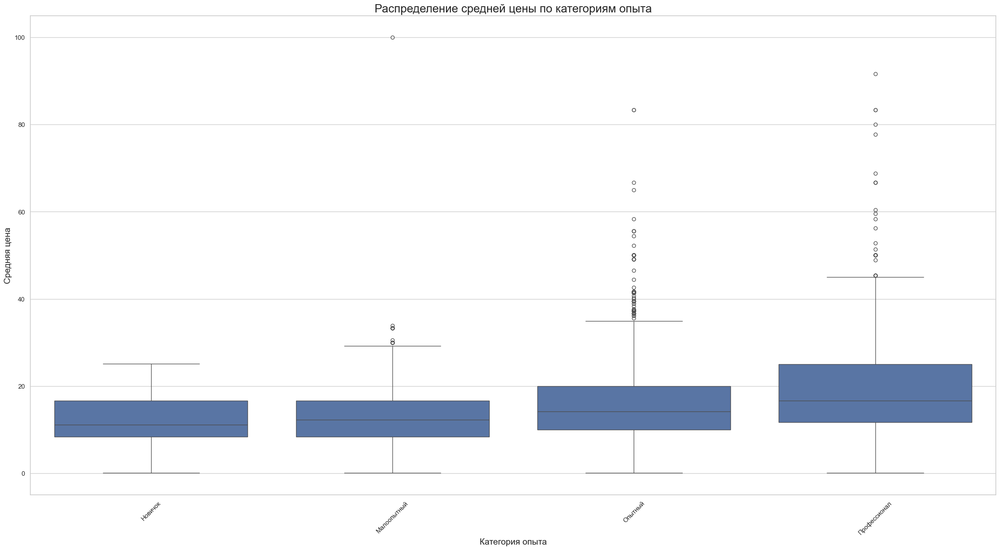

In [56]:
# Задаём размер
plt.rcParams['figure.figsize'] = (30, 15)


# Строим Boxplot
sns.boxplot(
    data = combined_df,
    x = 'experience_category',
    y = 'mean_price'
)


# Задаём названия осей
plt.title('Распределение средней цены по категориям опыта', fontsize = 20)
plt.xlabel('Категория опыта', fontsize = 15)
plt.ylabel('Средняя цена', fontsize = 15)
plt.xticks(rotation = 45)

# Отображаем график
plt.show()

**Вывод:**

Репетиторы с большей категорией опыта имеют более высокую среднюю стоимость услуг, при этом у опытных преподавателей наблюдается большая ценовая вариативность.

#### $4.7$

**Построим 3D-график, чтобы вычислить взаимосвязь между `mean_price` и (`tutor_rating`, `experience_numeric`)**:

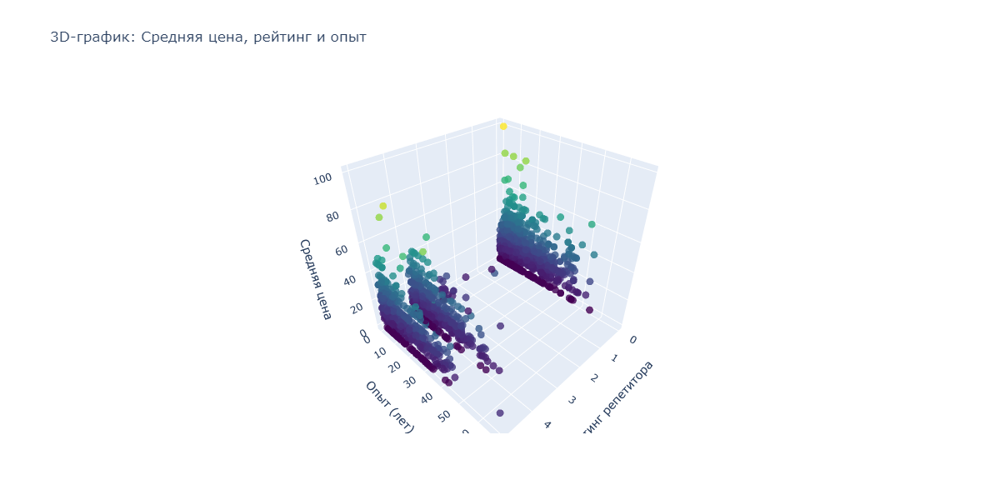

In [57]:
# Строим 3D-график
fig = go.Figure(
    data = [
        go.Scatter3d(
            x = combined_df['tutor_rating'],
            y = combined_df['experience_numeric'],
            z = combined_df['mean_price'],
            mode = 'markers',
            
            marker = dict(
                size = 5,
                color = combined_df['mean_price'],
                colorscale = 'Viridis',
                opacity = 0.8
            )
        )
    ]
)



# Настройка макета
fig.update_layout(
    width = 1200,
    height = 600,
    title = '3D-график: Средняя цена, рейтинг и опыт',
    scene = dict(
        xaxis_title = 'Рейтинг репетитора',
        yaxis_title = 'Опыт (лет)',
        zaxis_title = 'Средняя цена'
    )
)


# Отображаем график
fig.show('png')

## <CENTER> **`5.` Feature engineering (Создание новых признаков)**

На данном этапе преобразуем некоторые из признаков.

#### $5.1$

Признаки типа `category` приведём к типу `object`:

In [108]:
# Создаём список столбцов, которые имеют тип 'category'
category_colomns = [
    'experience_category',
    'category_range',
    'Education_grouped',
    'Education_type'
]


# Преобразовываем признаки
for column in category_colomns:
    combined_df[column] = combined_df[column].astype('object')
    X_test[column] = X_test[column].astype('object')

Выведем все категориальные признаки и количество уникальных значений:

In [109]:
# С помощью цикла for пройдёмся по столбцам датасета
# и выведем признаки типа 'object' и количество их уникальных значений
for column in combined_df.columns:
    if combined_df[column].dtype == object:
        print('"{}":   количество уникальных значений: {}'.format(column, combined_df[column].nunique()))
        print('-' * 70)
        print()

"status":   количество уникальных значений: 2
----------------------------------------------------------------------

"Subject":   количество уникальных значений: 2
----------------------------------------------------------------------

"tutor_main_category":   количество уникальных значений: 5
----------------------------------------------------------------------

"experience_category":   количество уникальных значений: 4
----------------------------------------------------------------------

"category_range":   количество уникальных значений: 4
----------------------------------------------------------------------

"Education_grouped":   количество уникальных значений: 13
----------------------------------------------------------------------

"Education_type":   количество уникальных значений: 8
----------------------------------------------------------------------

"year_graduation":   количество уникальных значений: 65
---------------------------------------------------------------

**Вывод:**

Из полученной информации видно, что большинство признаков имеют очень большое количество уникальных значений (> 15), поэтому порядок обработки будит следующий:

* Признаки с количество уникальных значений меньше 15 закадируем с помощью **OneHotEncoder**,

* Признаки с количество уникальных значений больше 15 закадируем с помощью **BinaryEncoder**.

Сперва разделим данные обратно на обучающую и тестовую выборки:

In [110]:
# Создаём список признаков для удаления
features_to_drop_list = ['is_train', 'mean_price']


# Обратно выделяем выборку 'train_data' и 'test_data' 
train_data = combined_df[combined_df['is_train'] == 1].drop(columns = 'is_train').reset_index(drop = True)
test_data = combined_df[combined_df['is_train'] == 0].drop(columns = features_to_drop_list).reset_index(drop = True)


# Выводим размеры получившихся выборок
print(f'Размер тренировочной выборки: {train_data.shape}')
print(f'Размер тестовой выборки: {X_test.shape}')
print(f'Индексы в train_data:\n\n{train_data.index}')
print('\n\n')
print(f'Индексы в X_test:\n\n{X_test.index}')

Размер тренировочной выборки: (4548, 16)
Размер тестовой выборки: (1516, 16)
Индексы в train_data:

RangeIndex(start=0, stop=4548, step=1)



Индексы в X_test:

RangeIndex(start=0, stop=1516, step=1)


#### $5.2$

**Обрабатываем признаки с помощью "OneHotEncoder()".**

Создадим функцию для обработки **DataFrame** при помощи алгоритма **OneHotEncoder**:

In [ ]:
# Глобально инициализируем OneHotEncoder
OH_encoder = preprocessing.OneHotEncoder(sparse_output = False, handle_unknown = 'ignore')

# Обучаем OneHotEncoder на train_data 
columns_to_change = [column for column in train_data.columns if train_data[column].dtype == object and train_data[column].nunique() < 15]
OH_encoder.fit(train_data[columns_to_change])




# Создаём функцию для обработки признаков типа 'object' при помощи алгоритма 'OHE'
def OHE_preprocessing(data):
    
    """
    Применяет OneHotEncoder к данным.
    OH_encoder уже обучен на train_data.
    columns_to_change так же определён заранее.
    
    """

    # Применяем OneHotEncoder 
    data_OneHot = pd.DataFrame(
        OH_encoder.transform(data[columns_to_change]),
        columns = OH_encoder.get_feature_names_out(columns_to_change),
        index = data.index
    )
    
    
    # Объединяем оба датафрейма
    data_new = pd.concat(
        [data.reset_index(drop = True).drop(columns_to_change, axis = 1), data_OneHot],
        axis = 1
    )
   
   
    # Выведем количество новых признаков
    print('Количество полученных признаков: {}'.format(data_OneHot.shape[1]))

    return data_new

Применяем полученную функцию к основной таблице:

In [112]:
# Применяем полученную функцию к 'train_data'
train_data = OHE_preprocessing(train_data)

# Выведем первые 5 строк
train_data.head()

Количество полученных признаков: 38


,tutor_rating,tutor_reviews,mean_price,experience_numeric,year_graduation,faculty,specialty,qualification,experience_rating_interaction,status_Многостатусный преподаватель,...,Education_grouped_Другие,Education_grouped_Репетитор не предоставил информацию об образовании,Education_type_Академия,Education_type_Другие,Education_type_Институт,Education_type_Классический университет,Education_type_Медицинский вуз,Education_type_Не указано,Education_type_Педагогический/Гуманитарный вуз,Education_type_Технический вуз
0,5.0,2,16.666667,31,unknown,unknown,unknown,unknown,5.049856,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,4.0,7,11.666667,8,unknown,unknown,unknown,unknown,3.496508,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0,23.333333,11,2008,Математический,Математика и информатика,Учитель математики и информатики,0.000000,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4.0,19,0.116667,5,unknown,unknown,unknown,unknown,3.044522,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0,16.666667,19,2005,Энергетический,Электроснабжение промышленных предприятий,магистр электротехники,0.000000,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


Применяем полученную функцию к тестовой выборке:

In [113]:
# Применяем полученную функцию к 'X_test' 
X_test = OHE_preprocessing(X_test)

Количество полученных признаков: 38


#### $5.3$

**Обрабатываем признаки с помощью "BinaryEncoder()".**

Создадим функцию для обработки **DataFrame** при помощи алгоритма **BinaryEncoder**:

In [114]:
# Глобально инициализируем BinaryEncoder
binary_encoder = ce.BinaryEncoder()

# Определяем столбцы для BinaryEncoder на основе train_data 
binary_columns = [column for column in train_data.columns if train_data[column].dtype == object and train_data[column].nunique() >= 15]
print("Столбцы для BinaryEncoder:", binary_columns)

# Обучаем BinaryEncoder на train_data
binary_encoder.fit(train_data[binary_columns])




# Создаём функцию для обработки признаков типа 'object' при помощи алгоритма 'BE'
def BE_preprocessing(data):
    
    """
    Применяет BinaryEncoder к данным.
    binary_encoder уже обучен на train_data.
    binary_columns так же определён заранее.
    
    """
    
    # Применяем BinaryEncoder (только transform)
    data_binary = binary_encoder.transform(data[binary_columns])
    
    # Объединяем датасеты
    data_new = pd.concat([data, data_binary], axis = 1)

    # Выводим количество новых признаков
    print('Количество полученных признаков после BinaryEncoder: {}'.format(data_binary.shape[1]))

    return data_new

Столбцы для BinaryEncoder: ['year_graduation', 'faculty', 'specialty', 'qualification']


Применяем полученную функцию к основной таблице:

In [115]:
# Применяем полученную функцию к 'train_data'
train_data = BE_preprocessing(train_data)

# Выведем первые 5 строк
train_data.head()

Количество полученных признаков после BinaryEncoder: 36


,tutor_rating,tutor_reviews,mean_price,experience_numeric,year_graduation,faculty,specialty,qualification,experience_rating_interaction,status_Многостатусный преподаватель,...,specialty_9,qualification_0,qualification_1,qualification_2,qualification_3,qualification_4,qualification_5,qualification_6,qualification_7,qualification_8
0,5.0,2,16.666667,31,unknown,unknown,unknown,unknown,5.049856,0.0,...,1,0,0,0,0,0,0,0,0,1
1,4.0,7,11.666667,8,unknown,unknown,unknown,unknown,3.496508,0.0,...,1,0,0,0,0,0,0,0,0,1
2,0.0,0,23.333333,11,2008,Математический,Математика и информатика,Учитель математики и информатики,0.000000,0.0,...,0,0,0,0,0,0,0,0,1,0
3,4.0,19,0.116667,5,unknown,unknown,unknown,unknown,3.044522,0.0,...,1,0,0,0,0,0,0,0,0,1
4,0.0,0,16.666667,19,2005,Энергетический,Электроснабжение промышленных предприятий,магистр электротехники,0.000000,0.0,...,1,0,0,0,0,0,0,0,1,1


Применяем полученную функцию к тестовой выборке:

In [116]:
# Применяем полученную функцию к 'X_test'
X_test = BE_preprocessing(X_test)

Количество полученных признаков после BinaryEncoder: 36


#### $5.4$

Посмотрим на распределение целевой переменной `mean_price`:

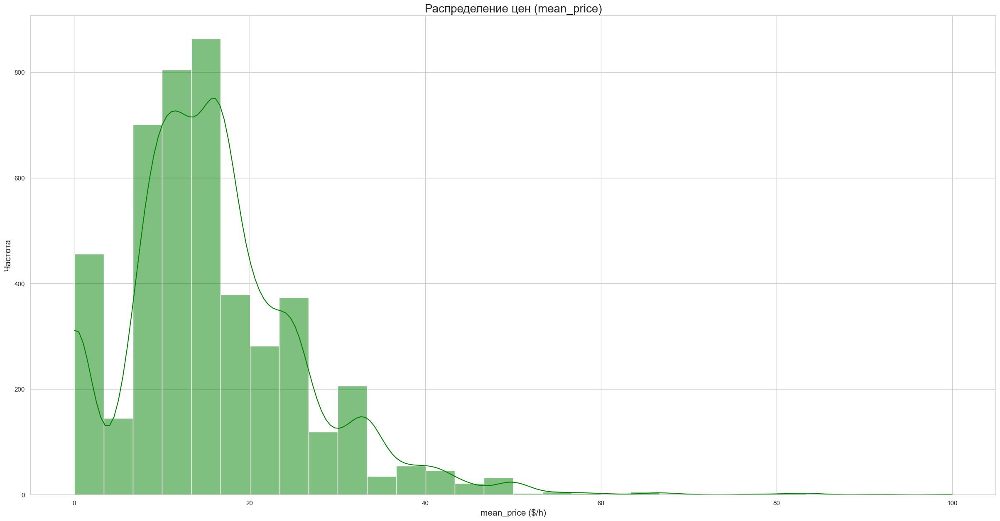

In [117]:
# Гистограмма для mean_price (обратное преобразование)
plt.rcParams['figure.figsize'] = (30, 15)

sns.histplot(
    train_data['mean_price'],
    bins = 30,
    kde = True,
    color = 'green'
)

plt.title('Распределение цен (mean_price)', fontsize = 20)
plt.xlabel('mean_price ($/h)', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()

**Вывод:**

Распределение признака `mean_price` сильно скошено вправо: большинство цен сосредоточено в диапазоне $0–$40/h, с пиком около $20/h. Так же виден длинный правый хвост: есть редкие значения до $100/h и выше.

Удалим выбросы (цены < $0.37/h и > $90/h):

In [118]:
# Определение границ для обрезки
lower_bound_price = 1.0    # $1/h
upper_bound_price = 100.0  # $100/h


# Фильтрация данных по mean_price
mask = (train_data['mean_price'] >= lower_bound_price) & (train_data['mean_price'] <= upper_bound_price)
train_data = train_data[mask]


# Прологорифмируем целевую переменную (создадим новый признак 'mean_price_log')
train_data['mean_price_log'] = np.log(train_data['mean_price'])

Построим визуализации обновлённых данных:

------------------------------------------------------------------------------------------------------------------------------------------------------
Гистограмма для "mean_price" после обработки выбросов:


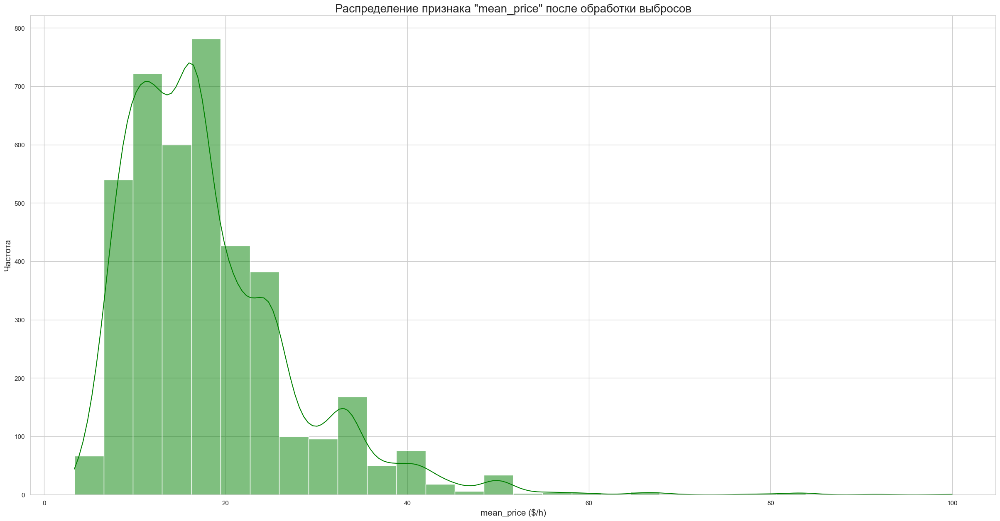

------------------------------------------------------------------------------------------------------------------------------------------------------
Гистограмма для "mean_price_log" после обработки выбросов:


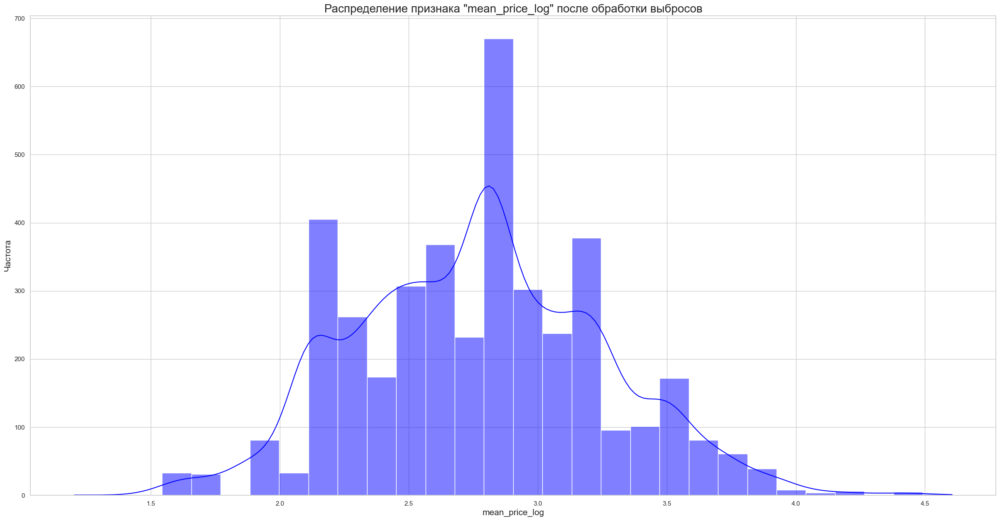

------------------------------------------------------------------------------------------------------------------------------------------------------
Коробчатая диаграмма для "mean_price_log" после обработки выбросов


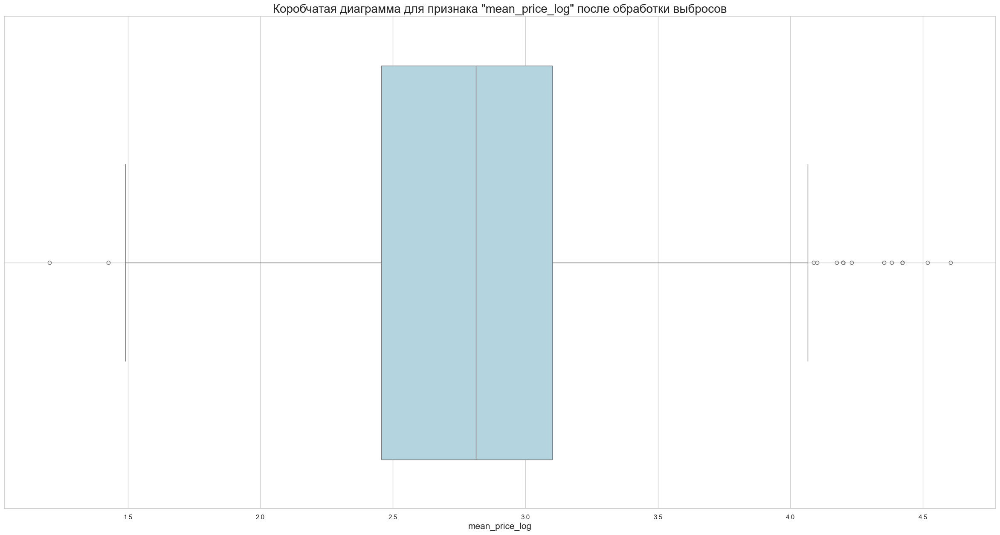

------------------------------------------------------------------------------------------------------------------------------------------------------


In [119]:
# Гистограмма для "mean_price" после обработки выбросов
print('-' * 150)
print('Гистограмма для "mean_price" после обработки выбросов:')

plt.figure(figsize = (30, 15))
sns.histplot(train_data['mean_price'], bins = 30, kde = True, color = 'green')
plt.title('Распределение признака "mean_price" после обработки выбросов', fontsize = 20)
plt.xlabel('mean_price ($/h)', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()
print('-' * 150)



# Гистограмма для "mean_price_log" после обработки выбросов
print('Гистограмма для "mean_price_log" после обработки выбросов:')

plt.figure(figsize = (30, 15))
sns.histplot(train_data['mean_price_log'], bins = 30, kde = True, color = 'blue')
plt.title('Распределение признака "mean_price_log" после обработки выбросов', fontsize = 20)
plt.xlabel('mean_price_log', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(True)
plt.show()
print('-' * 150)



# Коробчатая диаграмма для "mean_price_log" после обработки выбросов
print('Коробчатая диаграмма для "mean_price_log" после обработки выбросов')

plt.figure(figsize = (30, 15))
sns.boxplot(x = train_data['mean_price_log'], color = 'lightblue')
plt.title('Коробчатая диаграмма для признака "mean_price_log" после обработки выбросов', fontsize = 20)
plt.xlabel('mean_price_log', fontsize = 15)
plt.grid(True)
plt.show()
print('-' * 150)

**Вывод:**

Теперь распределения выглядят нормально, для обучения воспользуемся переменной `mean_price_log`.

#### $5.4$

Удалим признаки типа `object`:

In [120]:
# Создаём функцию для удалени признаков типа 'object'
def object_columns_del(data):
    
    # Создаём список признаков типа 'object' и удалим их из итогового датасета
    object_columns = [feature for feature in data.columns if data[feature].dtype == object]
    data.drop(object_columns, axis = 1, inplace = True)
    
    return data
    
    
    
    
# Применяем полученную функцию к основному DataFrame
train_data = object_columns_del(train_data)

# Выведем типипзацию признаков
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4093 entries, 0 to 4547
Data columns (total 80 columns):
 #   Column                                                                                                                           Non-Null Count  Dtype  
---  ------                                                                                                                           --------------  -----  
 0   tutor_rating                                                                                                                     4093 non-null   float64
 1   tutor_reviews                                                                                                                    4093 non-null   int64  
 2   mean_price                                                                                                                       4093 non-null   float64
 3   experience_numeric                                                                                     

Удалим признаки типа `object` из тестовой выборки:

In [121]:
# Применяем полученную функцию к 'X_test'
X_test = object_columns_del(X_test)

## <CENTER> **`6.` Отбор признаков**

На данном этапе проведём корреляционный анализмежду признаками, по необходимости избавимся от мультиколлинеарности, проведём нормализацию и отберём только самые информативные признаки для дальнейшего исследования.

#### $6.1$

Для начала проведём корреляционный анализ. Построим тепловую карту корреляций признаков:

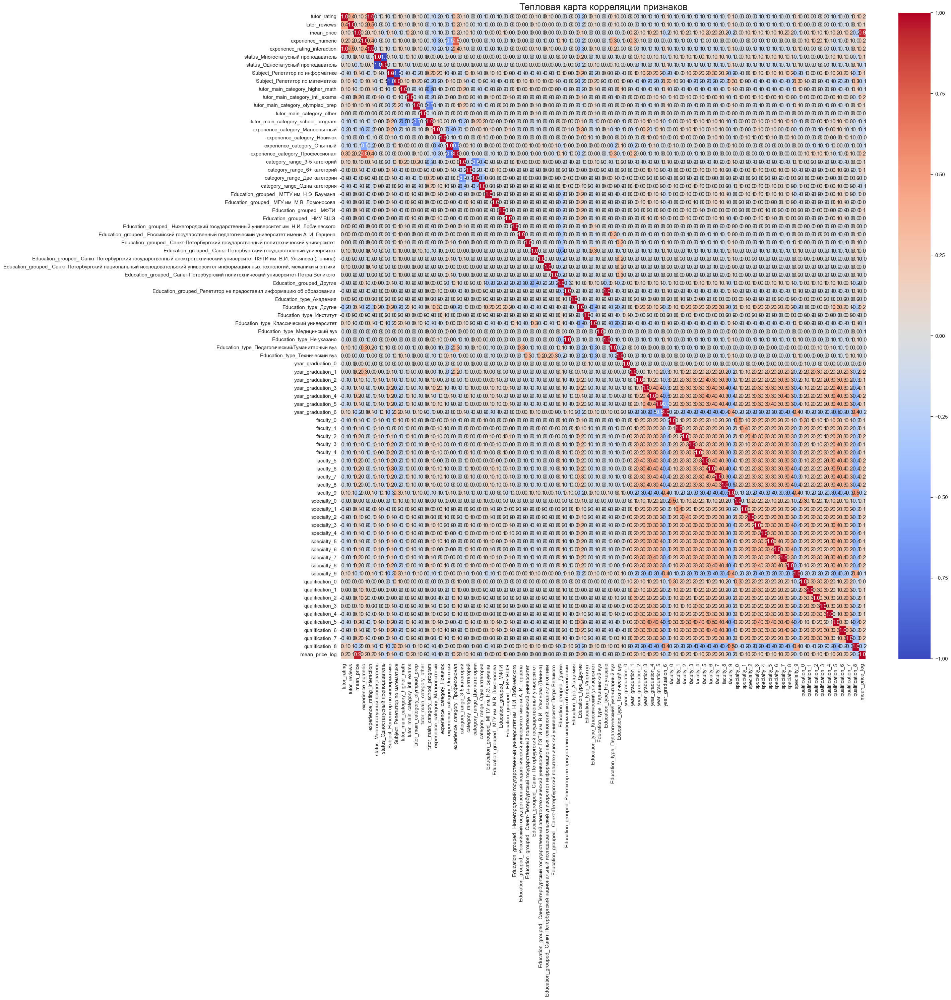

In [122]:
# Задаём параметры графика
plt.rcParams['figure.figsize'] = (30, 30)
correlation_matrix = train_data.corr()



# Строим тепловую карту
sns.heatmap(
    correlation_matrix, 
    annot = True,
    cmap = 'coolwarm',
    vmin = -1, 
    vmax = 1, 
    center = 0, 
    fmt = '.1f',
    linewidths = 0
)

# Настраиваем параметры
plt.title('Тепловая карта корреляции признаков', fontsize = 20)
plt.tight_layout()

# Выводим график
plt.show()

**Вывод:**

Исходя из полученной карты видно, самая высококоррелированная связь достигает значения $1.0$ между признаками:

* `Education_grouped_Репетитор не предоставил информацию об образовании` и `Education_type_Не указано`,

* `tutor_rating` и `experience_rating_interaction`

также высокая корреляция наблюдается между признаками `experience_numeric` и `experience_category_Профессионал`. 

Удалим по одному из указанных пар столбцов:

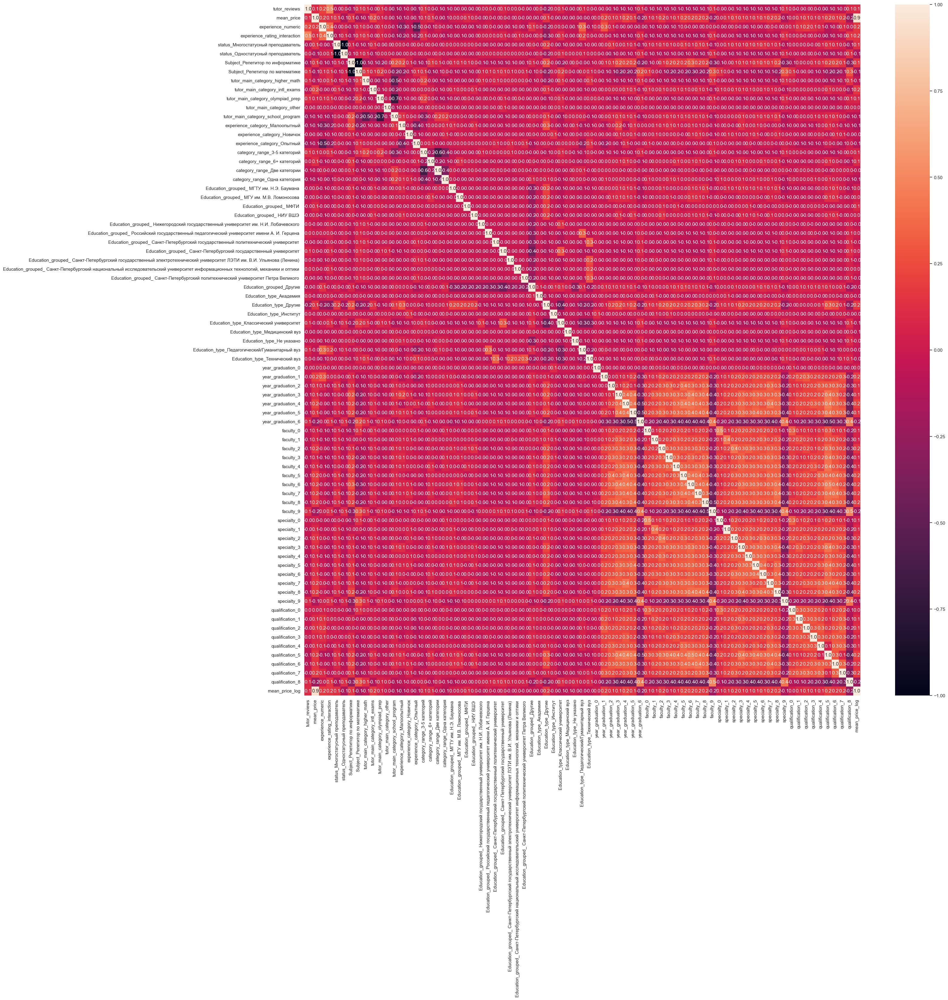

In [123]:
# Создаём список признаков с высокой корреляцией и удалим их из датасета
columns_to_drop = [
    'Education_grouped_Репетитор не предоставил информацию об образовании ',
    'experience_category_Профессионал',
    'tutor_rating'
]

train_data.drop(columns_to_drop, axis = 1, inplace = True)
X_test.drop(columns_to_drop, axis = 1, inplace = True)



# Повторно строим график
# Задаём параметры графика
plt.rcParams['figure.figsize'] = (30, 30)

# Строим график
sns.heatmap(
    data = train_data.corr(),
    annot = True,
    fmt = '.1f',
    linewidths = 0
);

**Вывод:**

Теперь значения корреляции признаков находятся в диапазоне $(+-) 0.7$.

#### $6.2$

**Разделим данные на обучающую `X_train` и валидационную `X_valid` выборки, а также выделим целевую переменную `y`.**

Разделим данные на матрицу наблюдений и вектор правильных ответов:

In [124]:
# Создаём список признаков для удаления
features_to_drop_list = ['mean_price', 'mean_price_log']



# Матрица наблюдений X
X = train_data.drop(columns = features_to_drop_list)

# Вектор правильных ответов
y = train_data['mean_price']
y_log = train_data['mean_price_log']

Теперь разделим данные на обучающую (берём прологорифмированный признак) и валидационную выборки:

In [125]:
# Разделяем train_data на тренировочную и валидационную выборки (70% на тренировку, 30% на валидацию)
X_train, X_valid, y_train_log, y_valid_log = model_selection.train_test_split(
    X, y_log,
    test_size = 0.3,
    random_state = 42
)


# Удаляем признаки с нулевой дисперсией
X_train = X_train.loc[:, X_train.var() > 0]
X_valid = X_valid[X_train.columns]


# Выведем итоговые размерности
print('Размер тренировочной выборки: {}'.format(X_train.shape))
print('Размер валидационной выборки: {}'.format(X_valid.shape))
print('Размер тестовой выборки: {}'.format(X_test.shape))

Размер тренировочной выборки: (2865, 75)
Размер валидационной выборки: (1228, 75)
Размер тестовой выборки: (1516, 75)


#### $6.3$

Произведём нормализацию признаков при помощи алгоритма `MinMaxScaler()`, но для начала построим график распределения:

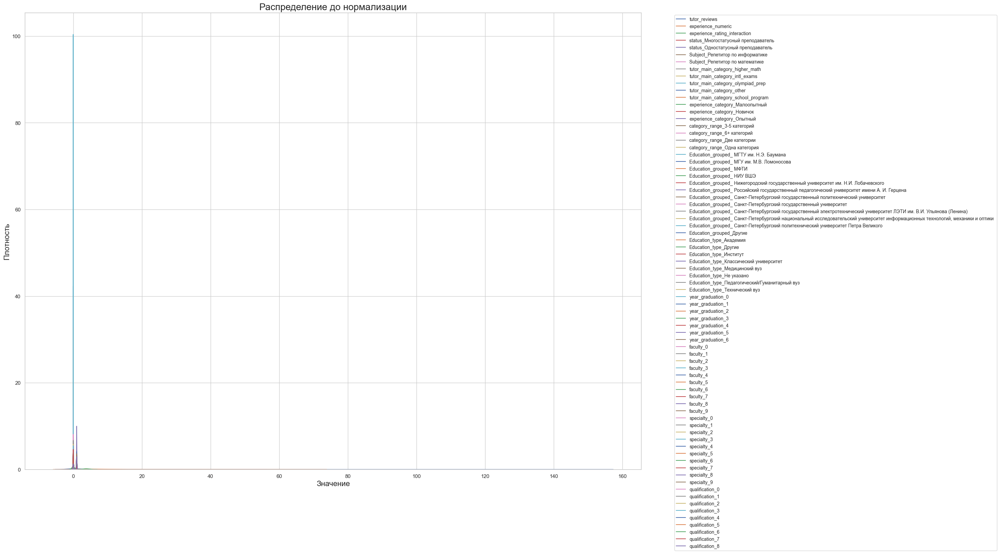

In [126]:
# Задаём размер графика
fig, ax = plt.subplots(figsize = (30, 17))

# Построение плотностей распределения
for column in X_train.columns:
    sns.kdeplot(
        X_train[column], 
        label = column, 
        ax = ax
)



# Настройка легенды: выносим за пределы графика
plt.legend(
    bbox_to_anchor = (1.05, 1),
    loc = 'upper left',
    fontsize = 10
)

# Настройка графика
plt.title('Распределение до нормализации', fontsize = 20)
plt.xlabel('Значение', fontsize = 16)
plt.ylabel('Плотность', fontsize = 16)
plt.tight_layout()  
plt.show()

Произведём преобразование:

In [ ]:
# Глобально инициализируем MinMaxScaler
mm_scaler = preprocessing.MinMaxScaler()

# Обучаем MinMaxScaler на X_train
mm_scaler.fit(X_train)




# Создаём функцию для нормализации признаков 
def MMS_preprocessing(data):
    
    """
    Применяет MinMaxScaler к числовым признакам данных.
    mm_scaler уже обучен на X_train.
    numeric_columns так же определён заранее.
    
    """
    
    # Применяем MinMaxScaler (только transform)
    data_scaled = pd.DataFrame(
        mm_scaler.transform(data),
        columns  = data.columns,
        index = data.index
    )

    # Выводим количество числовых признаков
    print('Количество числовых признаков после "MinMaxScaler": {}'.format(data_scaled.shape[1]))

    return data_scaled

Применяем полученную функцию к таблицам `X_train`, `X_valid` и `X_test`:

In [128]:
# Нормализуем 'X_train', 'X_valid' и 'X_test'
X_train_processed = MMS_preprocessing(X_train)
X_valid_processed = MMS_preprocessing(X_valid)
X_test_processed = MMS_preprocessing(X_test)

Количество числовых признаков после "MinMaxScaler": 75
Количество числовых признаков после "MinMaxScaler": 75
Количество числовых признаков после "MinMaxScaler": 75


Выведем график после нормализации:

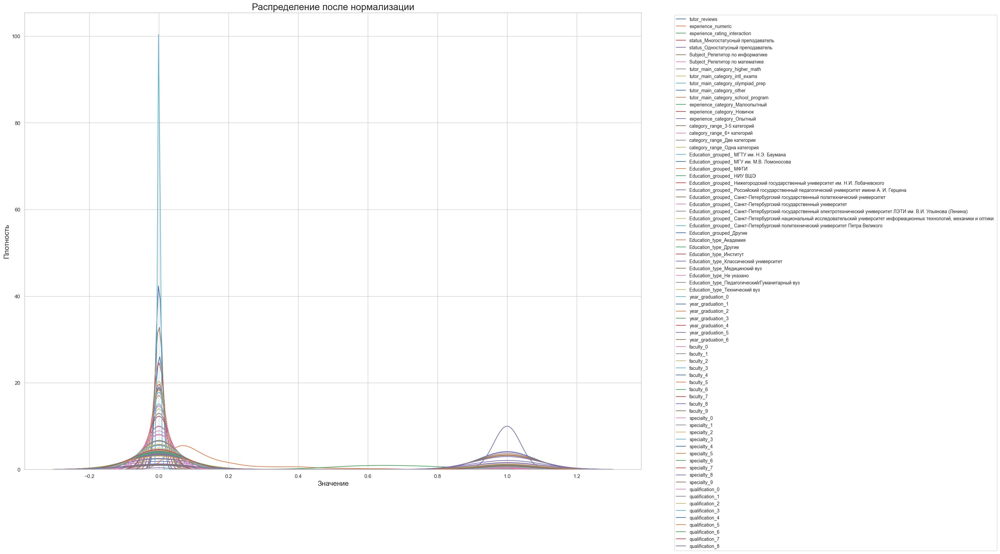

In [129]:
# Задаём размер графика
fig, ax = plt.subplots(figsize = (30, 17))

# Построение плотностей распределения
for column in X_train_processed.columns:
    sns.kdeplot(
        X_train_processed[column],
        label = column, 
        ax = ax
)



# Настройка легенды: выносим за пределы графика
plt.legend(
    bbox_to_anchor = (1.05, 1),
    loc = 'upper left',
    fontsize = 10
)

# Настройка графика
plt.title('Распределение после нормализации', fontsize = 20)
plt.xlabel('Значение', fontsize = 15)
plt.ylabel('Плотность', fontsize = 15)
plt.tight_layout()  
plt.show()

#### $6.4$

**Отбор самых информативных признаков.**

Производить отбор признаков будем в 2 этапа:

1. Отберём 25 признаков с помощью алгоритма **Mutual Information**,
2. Из очтавшихся отберём 15 признаков с помощью алгоритмов **RFE** с **SVR**.

**Первый этап:** используем алгоритм `Mutual Information` чтобы выделить 25 наиболее важных признаков для предсказания:

In [130]:
# Вычисление взаимной информации
MI_regression = feature_selection.mutual_info_regression(X_train_processed, y_train_log, random_state = 42)
MI_series = pd.Series(MI_regression, index = X_train_processed.columns).sort_values(ascending = False)


# Выбор топ-25 признаков
important_features_mi = MI_series.head(25).index.tolist()
print(f'Топ-25 признаков по Mutual Information:\n\n{important_features_mi}')


# Оставляем только выбранные признаки
X_train_25 = X_train_processed[important_features_mi]
X_valid_25 = X_valid_processed[important_features_mi]
X_test_25 = X_test_processed[important_features_mi]

Топ-25 признаков по Mutual Information:

['experience_numeric', 'experience_rating_interaction', 'Subject_Репетитор по математике', 'tutor_reviews', 'Education_type_Другие', 'Subject_Репетитор по информатике', 'qualification_8', 'year_graduation_6', 'faculty_8', 'qualification_5', 'specialty_8', 'faculty_6', 'category_range_6+ категорий', 'specialty_9', 'faculty_5', 'Education_type_Классический университет', 'faculty_9', 'year_graduation_4', 'experience_category_Малоопытный', 'faculty_7', 'year_graduation_5', 'year_graduation_3', 'category_range_3-5 категорий', 'specialty_5', 'faculty_3']


Построим визуализацию значимости признаков:

C:\Users\User\AppData\Local\Temp\ipykernel_3220\1146290915.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


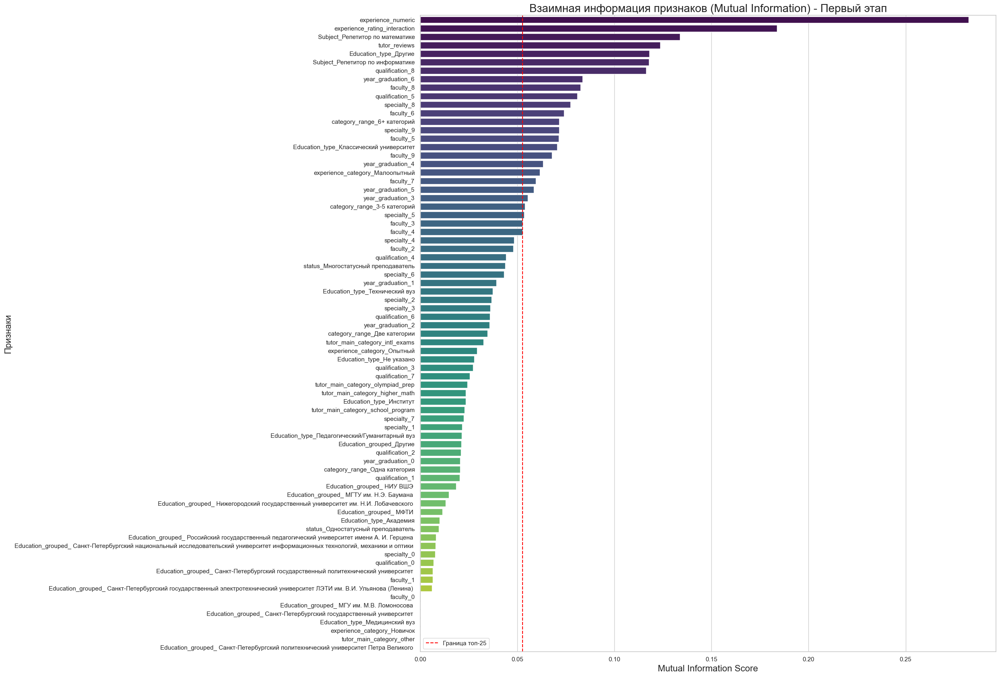

In [131]:
# Визуализация: Бар-чарт значимости признаков
plt.figure(figsize = (25, 17))

sns.barplot(
    x = MI_series.values,
    y = MI_series.index,
    palette = 'viridis'
)

plt.axvline(
    x = MI_series.iloc[24], 
    color = 'red', 
    linestyle = '--', 
    label = 'Граница топ-25'
)

plt.title('Взаимная информация признаков (Mutual Information) - Первый этап', fontsize = 20)
plt.xlabel('Mutual Information Score', fontsize = 16)
plt.ylabel('Признаки', fontsize = 16)
plt.legend()
plt.tight_layout()
plt.show()

**Второй этап:** используем комбинацию алгоритмов **RFE** с **SVR**:

In [132]:
# Создаём объект класса SVR
SVR_model = svm.SVR(kernel = 'linear')


# Создаём объект класса RFE и обучаем его
RFE_model = feature_selection.RFE(
    estimator = SVR_model,
    n_features_to_select = 15
)

RFE_model.fit(X_train_25, y_train_log)



# Выбор топ-15 признаков
important_features_svr_rfe = X_train_25.columns[RFE_model.support_].tolist()
print(f'Итоговые 15 признаков после RFE (SVR):\n\n{important_features_svr_rfe}')


# Оставляем только выбранные признаки
X_train_15 = X_train_25[important_features_svr_rfe]
X_valid_15 = X_valid_25[important_features_svr_rfe]
X_test_15 = X_test_25[important_features_svr_rfe]

Итоговые 15 признаков после RFE (SVR):

['experience_numeric', 'experience_rating_interaction', 'Subject_Репетитор по математике', 'tutor_reviews', 'Education_type_Другие', 'Subject_Репетитор по информатике', 'qualification_8', 'year_graduation_6', 'qualification_5', 'category_range_6+ категорий', 'faculty_5', 'year_graduation_4', 'experience_category_Малоопытный', 'category_range_3-5 категорий', 'faculty_3']


Построим визуализацию значимости признаков:

Сортировка по рангу признаков:

                                         Ranking    Status
experience_numeric                             1    Выбран
category_range_3-5 категорий                   1    Выбран
experience_category_Малоопытный                1    Выбран
year_graduation_4                              1    Выбран
faculty_5                                      1    Выбран
qualification_5                                1    Выбран
year_graduation_6                              1    Выбран
category_range_6+ категорий                    1    Выбран
faculty_3                                      1    Выбран
Subject_Репетитор по информатике               1    Выбран
experience_rating_interaction                  1    Выбран
Subject_Репетитор по математике                1    Выбран
Education_type_Другие                          1    Выбран
tutor_reviews                                  1    Выбран
qualification_8                                1    Выбран
specialty_9             

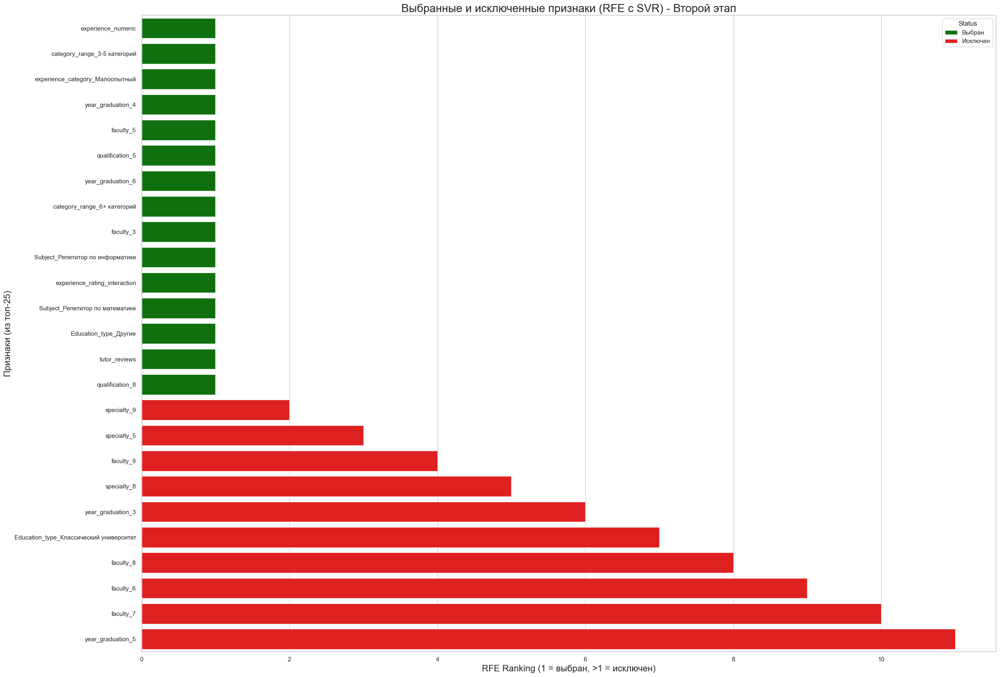

In [133]:
# Получение рангов (1 — выбран, >1 — исключен)
RFE_ranking = pd.Series(
    RFE_model.ranking_,
    index = X_train_25.columns
).sort_values()



# Подготовка данных для визуализации
RFE_status = pd.Series(
    ['Выбран' if rank == 1 else 'Исключен' for rank in RFE_model.ranking_],
    index = X_train_25.columns
)

RFE_ranking_df = pd.DataFrame(
    {'Ranking': RFE_model.ranking_, 'Status': RFE_status},
    index = X_train_25.columns
)

RFE_ranking_df = RFE_ranking_df.sort_values('Ranking')
print(f'Сортировка по рангу признаков:\n\n{RFE_ranking_df}')
print('-' * 70)



# Визуализация: Бар-чарт значимости признаков
plt.figure(figsize = (25, 17))

sns.barplot(
    x = 'Ranking',
    y = RFE_ranking_df.index,
    hue = 'Status',
    data = RFE_ranking_df,
    palette = {'Выбран': 'green', 'Исключен': 'red'}
)

plt.title('Выбранные и исключенные признаки (RFE с SVR) - Второй этап', fontsize = 20)
plt.xlabel('RFE Ranking (1 = выбран, >1 = исключен)', fontsize = 16)
plt.ylabel('Признаки (из топ-25)', fontsize = 16)
plt.tight_layout()
plt.show()

Построим тепловую карту корреляции признаков:

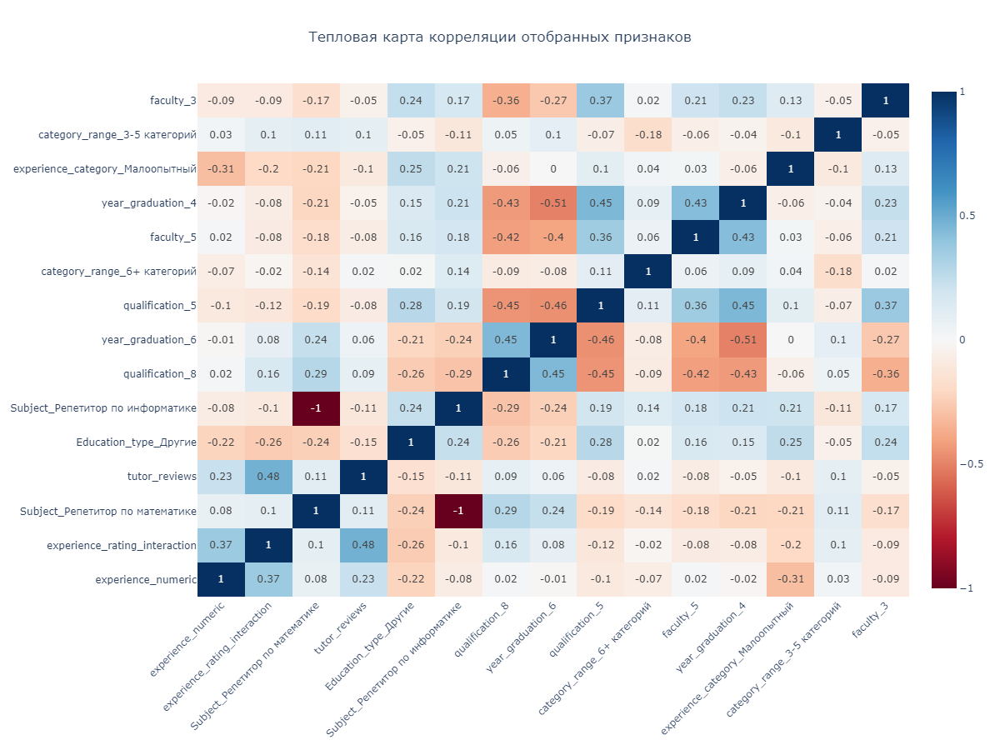

In [134]:
# Вычисляем корреляционную матрицу
correlation_matrix = X_train_15.corr()



# Создаём тепловую карту
fig = go.Figure(data = go.Heatmap(
    z = correlation_matrix.values,
    x = correlation_matrix.columns,
    y = correlation_matrix.index,
    colorscale = 'RdBu',
    zmin = -1,
    zmax = 1,
    text = correlation_matrix.values.round(2),  
    texttemplate = "%{text}",  
    hoverinfo = 'z'
))



# Настройка макета
fig.update_layout(
    title = 'Тепловая карта корреляции отобранных признаков',
    width = 1200,
    height = 900,
    title_x = 0.5,
    xaxis_tickangle = -45
)

# Отображение графика
fig.show('png')

**Вывод:**

Из полученной тепловой карты видно, что высококоррелированные связи отсутствуют.

## <CENTER> **`7.` Machine Learning**

На данном этапе мы построим несколько подходящих моделей и выявим наилучшую.

Используем следующие метрики для оценки:

* **MSE (Mean Squared Error)**: Среднеквадратичная ошибка, основная метрика,

* **RMSE (Root Mean Squared Error)**: Корень из MSE,

* **R² (коэффициент детерминации)**: Показывает, какую долю дисперсии объясняет модель (0–1, чем выше, тем лучше).

Создадим функцию для вычисления метрик:

In [135]:
# Создаём функцию 'print_metrics'       
def print_metrics(y_true, y_predict, model_name, decimal_places = 3):
    
    """
    Вычисляет и выводит метрики (MSE, RMSE, R², MAE) для оценки модели.
    
    Параметры:
    - y_true: истинные значения (например, y_valid_log)
    - y_pred: предсказанные значения (например, y_lr_predict)
    - model_name: строка с названием модели (например, "LinearRegression")
    - decimal_places: количество знаков после запятой для форматирования (по умолчанию 3)
    
    Возвращает:
    - Словарь с метриками (mse, rmse, r2, mae)
    
    """
    
    
    # Вычисляем метрики
    mse_metric = metrics.mean_squared_error(y_true, y_predict)
    rmse_metric = np.sqrt(mse_metric)
    mae_metric = metrics.mean_absolute_error(y_true, y_predict)
    r2_metric = metrics.r2_score(y_true, y_predict)
    
    
    # Выведем результат
    print(f'{model_name} (значения метрик):\n')
    print(f'Mean Squared Error: {mse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Root Mean Squared Error: {rmse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Error: {mae_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'R²: {r2_metric:.{decimal_places}f}')
    print('-' * 35)

#### $7.1$

#### **Линейная регрессия (Linear Regression)**

Построим модель полиномиальной регрессии второй степени на обучающем наборе. Все параметры оставим по умолчанию:

In [136]:
# Создаём генератор полиномиальных признаков PolynomialFeatures() и обучим её
poly_features = preprocessing.PolynomialFeatures(
    degree = 2,
    include_bias = False
)

poly_features.fit(X_train_15)



# Генерируем полиномиальные признаки на тренировочной и валидационной наборках данных
X_train_poly = poly_features.transform(X_train_15)
X_valid_poly = poly_features.transform(X_valid_15)



# Создаём объект класса LinearRegression() и обучим её
LR_model_poly = linear_model.LinearRegression()
LR_model_poly.fit(X_train_poly, y_train_log)

# Делаем предсказания на валидационной выборке
y_lr_predict = LR_model_poly.predict(X_valid_poly)

Считаем метрики:

In [137]:
# Применяем функцию 'print_metrics'            
print_metrics(y_valid_log, y_lr_predict, 'LinearRegression')

LinearRegression (значения метрик):

Mean Squared Error: 0.177
-----------------------------------
Root Mean Squared Error: 0.420
-----------------------------------
Mean Absolute Error: 0.337
-----------------------------------
R²: 0.215
-----------------------------------


**Вывод:**

Низкие значения $MSE (0.012)$ и $RMSE (0.110)$ в сочетании с высоким $R² (0.946)$ указывают на то, что модель даёт очень хорошее предсказание.

Построим модель полиномиальной регрессии второй степени с $L_2$-регуляризацией (регуляризацией Тихонова) на обучающем наборе. Коэффициент регуляризации вычислим с помощью `GridSearchCV()`, остальные параметры оставим по умолчанию:

In [138]:
# Создаём объекта класса линейной регрессии с L2-регуляризацией
LR_model_ridge = linear_model.Ridge()


# Определение пространства поиска гиперпараметров
param_grid = {
    'alpha': [0.1, 1.0, 10.0, 100.0]
}



# Выполнение перебора гиперпараметров с помощью GridSearchCV
grid_search = model_selection.GridSearchCV(
    estimator = LR_model_ridge,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)

# Обучаем модель 
grid_search.fit(X_train_poly, y_train_log)

# Делаем предсказания на валидационной выборке
y_ridge_predict = grid_search.predict(X_valid_poly)



# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Наилучшие значения гиперпараметров: {'alpha': 1.0}


Считаем метрики:

In [139]:
# Применяем функцию 'print_metrics'            
print_metrics(y_valid_log, y_ridge_predict, 'Ridge')

Ridge (значения метрик):

Mean Squared Error: 0.176
-----------------------------------
Root Mean Squared Error: 0.419
-----------------------------------
Mean Absolute Error: 0.338
-----------------------------------
R²: 0.218
-----------------------------------


**Вывод:**

Значения метрик с использованием модели полиномиальной регрессии второй степени с $L_2$-регуляризацией слегка ухудшились, но при этом качество модели остаётся достаточно высоким. Попробуем воспользоваться другими моделями.

#### $7.2$

#### **Метод опорных векторов (SVR — Support Vector Regression)**

Перед обучением организуем перебор при помощи **GridSearchCV()**:

In [93]:
# Создаем объект класса SVR()
SVR_model = svm.SVR()


# Определение параметров для поиска
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.01, 0.1, 0.5],
    'kernel': ['rbf', 'linear']
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = SVR_model,
    param_grid = param_grid,
    cv = 5,
    scoring = 'neg_mean_squared_error'
)



# Обучаем модель 
grid_search.fit(X_train_15, y_train_log)

# Делаем предсказание для валидационной выборки
y_svr_predict = grid_search.predict(X_valid_15)



# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Наилучшие значения гиперпараметров: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


Считаем метрики:

In [94]:
# Применяем функцию 'print_metrics'            
print_metrics(y_valid_log, y_svr_predict, 'SupportVectorRegression')

SupportVectorRegression (значения метрик):

Mean Squared Error: 0.018
-----------------------------------
Root Mean Squared Error: 0.133
-----------------------------------
Mean Absolute Error: 0.077
-----------------------------------
R²: 0.922
-----------------------------------


#### $7.3$

#### **Random Forest Regression (Случайный лес)**

Перед обучением организуем перебор при помощи **GridSearchCV()**:

In [95]:
# Создаем объект класса RandomForestRegressor()
RF_Regression = ensemble.RandomForestRegressor(random_state = 42)


# Определение параметров для поиска
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = RF_Regression,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)



# Обучаем модель 
grid_search.fit(X_train_15, y_train_log)

# Делаем предсказание для валидационной выборки
y_rfr_predict = grid_search.predict(X_valid_15)



# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 3 folds for each of 360 candidates, totalling 1080 fits
Наилучшие значения гиперпараметров: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}


Считаем метрики:

In [96]:
# Применяем функцию 'print_metrics'            
print_metrics(y_valid_log, y_rfr_predict, 'RandomForestRegressor')

RandomForestRegressor (значения метрик):

Mean Squared Error: 0.024
-----------------------------------
Root Mean Squared Error: 0.154
-----------------------------------
Mean Absolute Error: 0.085
-----------------------------------
R²: 0.895
-----------------------------------


#### $7.4$

#### **XGBoost (Градиентный бустинг)**

Построим модель `XGBRegressor()` на тренировочной выборке.

Оптимизируем гиперпараметры при поиощи **Optuna**:

In [97]:
# Фиксируем значение random_state
random_state = 42



# Создаём функцию для оптимизации гиперпараметров
def optuna_xgb(trial):
    
    # Задаем пространства поиска гиперпараметров
    params = {
        'booster': trial.suggest_categorical('booster', ['gbtree', 'gblinear', 'dart']),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'objective': 'reg:squarederror',
        'verbosity': 0
    }
    
    
    # Cоздаем модель и обучаем её
    XGB_Regressor = XGBRegressor(**params)
    XGB_Regressor.fit(X_train_15, y_train_log)
    
    # Делаем предсказание для обучающей и валидационной выборок
    y_xgb_predict = XGB_Regressor.predict(X_valid_15)
    
    # Рассчитываем метрику R²
    r2_metric = metrics.r2_score(y_valid_log, y_xgb_predict)
    
    return r2_metric



# Cоздаем объект исследования
study = optuna.create_study(
    study_name = 'XGBRegressor',
    direction = 'minimize'
)


# Ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(optuna_xgb, n_trials = 100)

# Сохраним полученные гиперпараметры в переменной
best_parameters = study.best_params


# Выводим результаты на валидационной выборке
print('R² на валидационной выборке: {:.2f}'.format(study.best_value))
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

[I 2025-04-04 01:11:37,886] A new study created in memory with name: XGBRegressor
[I 2025-04-04 01:11:39,259] Trial 0 finished with value: 0.5613603896096435 and parameters: {'booster': 'gblinear', 'learning_rate': 0.2673517214759595, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9699490804751847, 'colsample_bytree': 0.5813411564849387}. Best is trial 0 with value: 0.5613603896096435.
[I 2025-04-04 01:11:39,434] Trial 1 finished with value: 0.44118596493072415 and parameters: {'booster': 'gblinear', 'learning_rate': 0.12484292579295923, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.6660808036088863, 'colsample_bytree': 0.9947356051803201}. Best is trial 1 with value: 0.44118596493072415.
[I 2025-04-04 01:11:39,690] Trial 2 finished with value: 0.9840071732400355 and parameters: {'booster': 'gbtree', 'learning_rate': 0.1944120129995386, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.7148422728233916, 'colsample_bytree': 0.5542392399703724}. Best is trial 1 with va

R² на валидационной выборке: 0.17
Наилучшие значения гиперпараметров: {'booster': 'gblinear', 'learning_rate': 0.01003309743804386, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.8761861751710277, 'colsample_bytree': 0.695403114727967}


1. Построим график важности гиперпараметров:

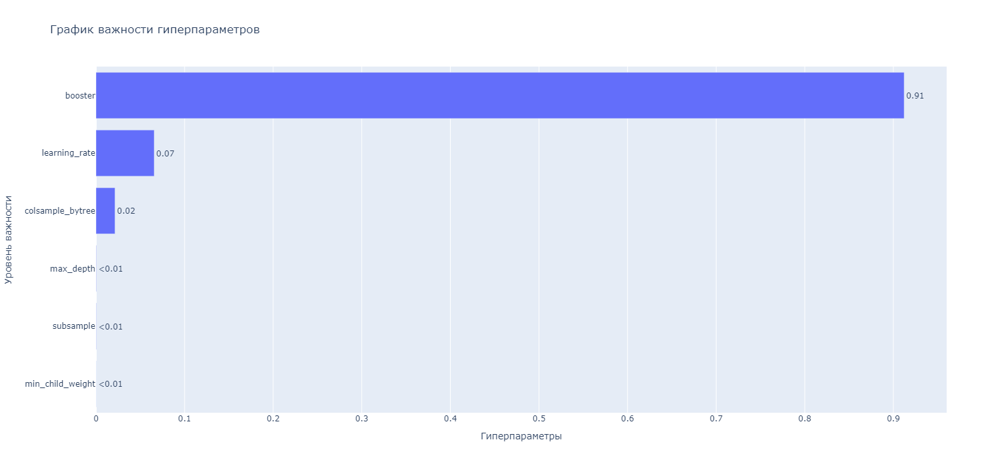

In [98]:
# Построение графика важности гиперпараметров
fig = optuna.visualization.plot_param_importances(study)


# Настройка параметров графика
fig.update_layout(
    title = 'График важности гиперпараметров',
    xaxis_title = 'Гиперпараметры',
    yaxis_title = 'Уровень важности',
    width = 1500,
    height = 700
)

fig.show('png')

2. Построим график истории оптимизации:

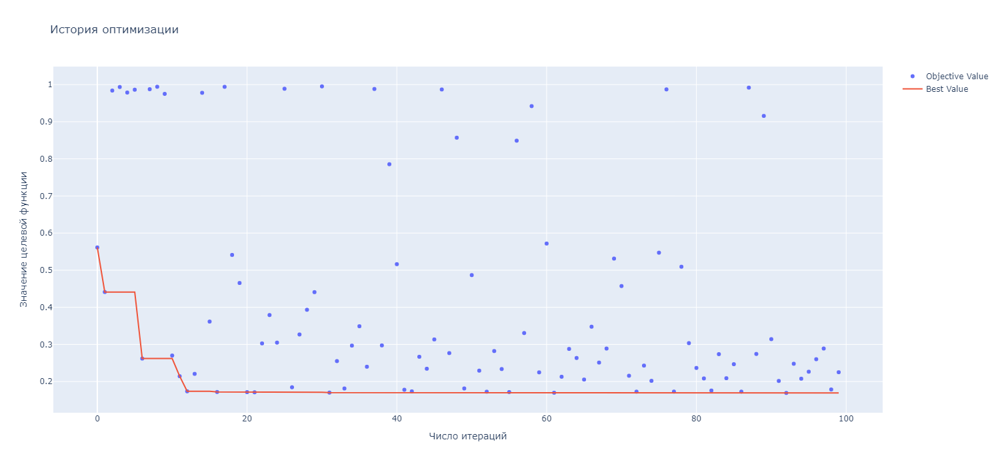

In [99]:
# Построение графика истории оптимизации
fig = optuna.visualization.plot_optimization_history(study)


# Настройка параметров графика
fig.update_layout(
    title = 'История оптимизации',
    xaxis_title = 'Число итераций',
    yaxis_title = 'Значение целевой функции',
    width = 1500,
    height = 700
)

fig.show('png')

3. Построим график среза гиперпараметров:

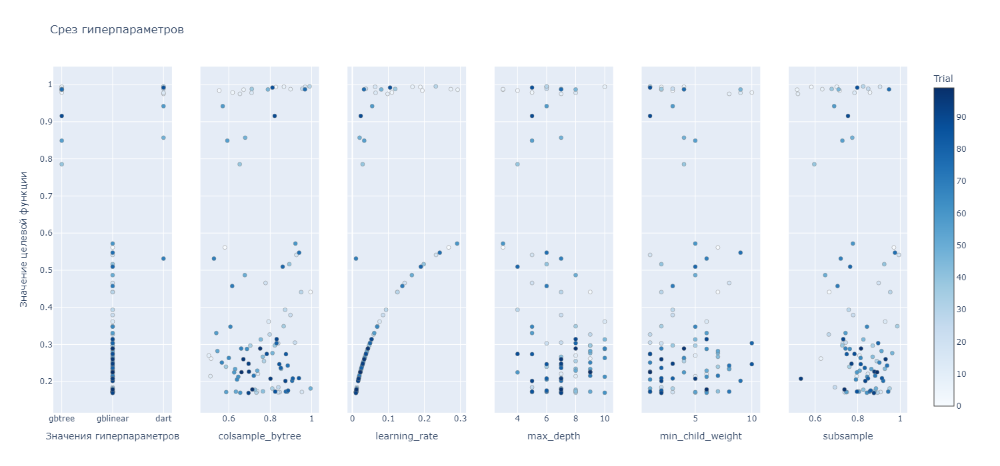

In [100]:
# Построение графика истории оптимизации
fig = optuna.visualization.plot_slice(study)


# Настройка параметров графика
fig.update_layout(
    title = 'Срез гиперпараметров',
    xaxis_title = 'Значения гиперпараметров',
    yaxis_title = 'Значение целевой функции',
    width = 1500,
    height = 700
)

fig.show('png')

4. Построим график контуров:

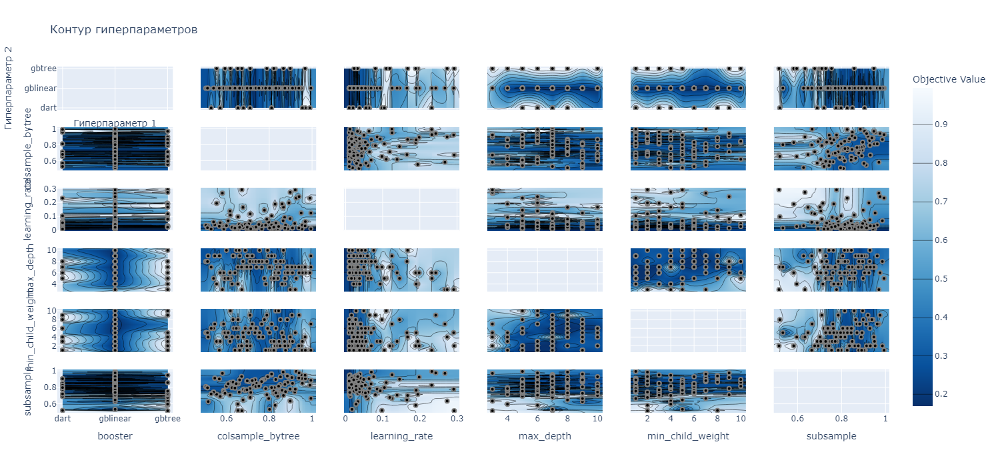

In [101]:
# Построение графика истории оптимизации
fig = optuna.visualization.plot_contour(study)


# Настройка параметров графика
fig.update_layout(
    title = 'Контур гиперпараметров',
    xaxis_title = 'Гиперпараметр 1',
    yaxis_title = 'Гиперпараметр 2',
    width = 1500,
    height = 700
)

fig.show('png')

Теперь попробуем обучить модель подбирая наилучшие гиперпараметры при помощи **GridSearchCV()**:

In [102]:
# Создаем объект класса XGBRegressor()
XGB_model = XGBRegressor(random_stat = 42)



# Определяем параметры для поиска
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.3],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'subsample': [0.6, 0.8, 1.0],
    'min_child_weight': [1, 3, 5]
}



# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = XGB_model,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)



# Обучаем модель
grid_search.fit(X_train_15, y_train_log)

# Делаем предсказание для валидационной выборки
y_xgb_predict = grid_search.predict(X_valid_15)

# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров:\n\n{best_parameters}')

Fitting 3 folds for each of 729 candidates, totalling 2187 fits


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning:

[01:18:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "random_stat" } are not used.




Наилучшие значения гиперпараметров:

{'colsample_bytree': 1.0, 'learning_rate': 0.3, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 300, 'subsample': 1.0}


Считаем метрики:

In [103]:
# Применяем функцию 'print_metrics'            
print_metrics(y_valid_log, y_xgb_predict, 'XGBoost')

XGBoost (значения метрик):

Mean Squared Error: 0.001
-----------------------------------
Root Mean Squared Error: 0.026
-----------------------------------
Mean Absolute Error: 0.015
-----------------------------------
R²: 0.997
-----------------------------------


#### $7.5$

Составим таблицу (*DataFrame*) со следующими столбцами:

Наименование модели:

* `'model_name'`,

Метрики и их значения:

* `'Mean Squared Error'`,

* `'Root Mean Squared Error'`,

* `'Mean Absolute Error'`,

* `'R²'`.

In [104]:
# Создаём DataFrame
model_metrics = {
    'LinearRegression (Poly)'   : {'Mean Squared Error': 0.012, 'Root Mean Squared Error': 0.110, 'Mean Absolute Error': 0.083, 'R²': 0.946},
    'Ridge'                     : {'Mean Squared Error': 0.018, 'Root Mean Squared Error': 0.135, 'Mean Absolute Error': 0.104, 'R²': 0.919},
    'SupportVectorRegression'   : {'Mean Squared Error': 0.018, 'Root Mean Squared Error': 0.133, 'Mean Absolute Error': 0.077, 'R²': 0.922},
    'RandomForestRegressor'     : {'Mean Squared Error': 0.024, 'Root Mean Squared Error': 0.154, 'Mean Absolute Error': 0.085, 'R²': 0.895},
    'XGBoost'                   : {'Mean Squared Error': 0.001, 'Root Mean Squared Error': 0.026, 'Mean Absolute Error': 0.015, 'R²': 0.997}
}

metrics_df = pd.DataFrame(model_metrics).T



# Выводим таблицу
display(metrics_df)

,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R²
LinearRegression (Poly),0.012,0.110,0.083,0.946
Ridge,0.018,0.135,0.104,0.919
SupportVectorRegression,0.018,0.133,0.077,0.922
RandomForestRegressor,0.024,0.154,0.085,0.895
XGBoost,0.001,0.026,0.015,0.997


Определим лучшую модель :

In [105]:
# Находим модели с максимальными значениями для каждой метрики
best_model_mse = metrics_df['Mean Squared Error'].idxmax()
best_mse = metrics_df['Mean Squared Error'].max()

best_model_rmse = metrics_df['Root Mean Squared Error'].idxmax()
best_rmse = metrics_df['Root Mean Squared Error'].max()

best_model_mae = metrics_df['Mean Absolute Error'].idxmax()
best_mae = metrics_df['Mean Absolute Error'].max()

best_model_r2 = metrics_df['R²'].idxmax()
best_r2 = metrics_df['R²'].max()



# Выводим результаты
print(f'Лучшая модель по метрике "Mean Squared Error": {best_model_mse} с точностью {best_mse:.3f}')
print('-' * 90)
print()
print(f'Лучшая модель по метрике "Root Mean Squared Error": {best_model_rmse} с точностью {best_rmse:.3f}')
print('-' * 95)
print()
print(f'Лучшая модель по метрике "Mean Absolute Error": {best_model_mae} с точностью {best_mae:.3f}')
print('-' * 70)
print()
print(f'Лучшая модель по метрике "R²": {best_model_r2} с точностью {best_r2:.3f}')
print('-' * 60)

Лучшая модель по метрике "Mean Squared Error": RandomForestRegressor с точностью 0.024
------------------------------------------------------------------------------------------

Лучшая модель по метрике "Root Mean Squared Error": RandomForestRegressor с точностью 0.154
-----------------------------------------------------------------------------------------------

Лучшая модель по метрике "Mean Absolute Error": Ridge с точностью 0.104
----------------------------------------------------------------------

Лучшая модель по метрике "R²": XGBoost с точностью 0.997
------------------------------------------------------------


Среди обученных моделей, наилучшей оказалась модель `XGBoost`. Сохраним её:

In [108]:
# Загружаем или обучаем модель
try:
    XGB_model = joblib.load('XGBRegressor_model.pkl')
    print(f'Модель загружена: {type(XGB_model)}.')
    
except:
    # Создаем объект класса XGBRegressor()
    XGB_model = XGBRegressor(random_stat = 42)
    
    # Определяем параметры для поиска
    paran_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 6, 9],
        'learning_rate': [0.01, 0.1, 0.3],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'subsample': [0.6, 0.8, 1.0],
        'min_child_weight': [1, 3, 5]
    }

    # Производим поиск
    grid_search = model_selection.GridSearchCV(
        estimator = XGB_model,
        param_grid = param_grid,
        cv = 3,
        verbose = 2,
        n_jobs = -1
    )

    # Обучаем модель
    grid_search.fit(X_train_15, y_train_log)
    joblib.dump(grid_search, 'XGBRegressor_model.pkl')
    print('Модель обучена и сохранена в "XGBRegressor_model.pkl"')

Модель загружена: <class 'xgboost.sklearn.XGBRegressor'>.


Сделаем предсказание тестовой выборки:

In [109]:
# Делаем предсказания
y_test_predict = grid_search.predict(X_test_15)


# Делаем обратное преобразование
y_test_predict = np.expm1(y_test_predict)


# Проверяем количество предсказаний
print(f'Количество предсказаний: {len(y_test_predict)}')

# Проверяем первые несколько предсказаний
print('Первые 5 предсказаний: {}'.format(y_test_predict[: 5]))

Количество предсказаний: 1516
Первые 5 предсказаний: [42.004585   5.418423  74.387924   5.6432905  2.403572 ]


Создаём файл для сабмишена:

In [279]:
# Создаём DataFrame для сабмишена
if 'id' in X_test_15.columns:
    submission_df = pd.DataFrame({
        'index': X_test_15['id'],
        'mean_price': y_test_predict
    })
    
else:
    submission_df = pd.DataFrame({
        'index': X_test_15.index,
        'mean_price': y_test_predict
    })
    
    
    
# Проверяем созданный DataFrame
print('Первые 5 строк файла submission.csv:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(submission_df.shape[0], submission_df.shape[1]))

# Выведем первые пять строк 
display(submission_df.head())



# Сохраняем в CSV
submission_df.to_csv('submission.csv', index = False)
print('Файл "submission.csv" сохранён.')

Первые 5 строк файла submission.csv:

Количество строк: 1516;
Количество признаков (столбцов): 2.


,index,mean_price
0,0,42.115360
1,1,5.609518
2,2,67.461243
3,3,4.866600
4,4,3.982800


Файл "submission.csv" сохранён.


## <CENTER> **`8.` Вывод**

Таким образом, среди всех рассмотренных моделей, модель градиентного бустинга **XGBoost** с подобранными гиперпараметрами при помощи алгоритма **GridSearchCV** показала наилучший результат с точки зрения качества на валидационных фолдах, а также с точки зрения переобученности (коэффициент детерминации $R² = 0.996$).